In [1]:
import numpy as np 
import pandas as pd
import scipy

from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EllipticEnvelope


import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
data_backup = pd.read_excel('data.xlsx')

/usr/lib/python3/dist-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [3]:
df = data_backup.copy()

In [4]:
df.head()

,time,Cyclone_Inlet_Gas_Temp,Cyclone_Material_Temp,Cyclone_Outlet_Gas_draft,Cyclone_cone_draft,Cyclone_Gas_Outlet_Temp,Cyclone_Inlet_Draft
0,2017-01-01 00:00:00,867.63,910.42,-189.54,-186.04,852.13,-145.9
1,2017-01-01 00:05:00,879.23,918.14,-184.33,-182.1,862.53,-149.76
2,2017-01-01 00:10:00,875.67,924.18,-181.26,-166.47,866.06,-145.01
3,2017-01-01 00:15:00,875.28,923.15,-179.15,-174.83,865.85,-142.82
4,2017-01-01 00:20:00,891.66,934.26,-178.32,-173.72,876.06,-143.39


In [5]:
df.shape

(377719, 7)

In [6]:
df.describe()

,time
count,377719
mean,2018-10-20 02:10:21.647840
min,2017-01-01 00:00:00
25%,2017-11-24 21:07:30
50%,2018-10-19 18:10:00
75%,2019-09-13 15:12:30
max,2020-08-07 12:15:00


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377719 entries, 0 to 377718
Data columns (total 7 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   time                      377719 non-null  datetime64[ns]
 1   Cyclone_Inlet_Gas_Temp    377719 non-null  object        
 2   Cyclone_Material_Temp     377719 non-null  object        
 3   Cyclone_Outlet_Gas_draft  377719 non-null  object        
 4   Cyclone_cone_draft        377719 non-null  object        
 5   Cyclone_Gas_Outlet_Temp   377719 non-null  object        
 6   Cyclone_Inlet_Draft       377719 non-null  object        
dtypes: datetime64[ns](1), object(6)
memory usage: 20.2+ MB


In [10]:
df['Cyclone_Inlet_Gas_Temp'].nunique()

39736

In [11]:
df['Cyclone_Gas_Outlet_Temp'].nunique()

48044

In [12]:
#fuction to check if a string can be converted to float
def check_float(x):
    try:
        float(x)
        return True
    except:
        return False

In [13]:
cols = [col for col in df.columns if col != 'time']
for i in cols:
    x = df[i].astype(str)
    print(x[[not check_float(i) for i in x]].value_counts())

Cyclone_Inlet_Gas_Temp
Not Connect     723
I/O Timeout     470
Configure       108
Scan Timeout     17
Comm Fail         2
Name: count, dtype: int64
Cyclone_Material_Temp
Not Connect     723
I/O Timeout     470
Unit Down       271
Configure       108
Scan Timeout     17
Comm Fail         2
Name: count, dtype: int64
Cyclone_Outlet_Gas_draft
Not Connect     723
I/O Timeout     470
Configure       108
Scan Timeout     17
Comm Fail         2
Unit Down         1
Name: count, dtype: int64
Cyclone_cone_draft
Not Connect     723
I/O Timeout     470
Configure       108
Scan Timeout     17
Comm Fail         2
Name: count, dtype: int64
Cyclone_Gas_Outlet_Temp
Not Connect     723
I/O Timeout     470
Configure       108
Scan Timeout     17
Comm Fail         2
Unit Down         1
Name: count, dtype: int64
Cyclone_Inlet_Draft
Not Connect     723
I/O Timeout     470
Configure       108
Scan Timeout     17
Unit Down         2
Comm Fail         2
Name: count, dtype: int64


In [14]:
df = df.replace(['Not Connect','I/O Timeout', 'Configure', 'Scan Timeout', 'Unit Down','Comm Fail'], np.nan)


In [15]:
df.isnull().sum()

time                           0
Cyclone_Inlet_Gas_Temp      1320
Cyclone_Material_Temp       1591
Cyclone_Outlet_Gas_draft    1321
Cyclone_cone_draft          1320
Cyclone_Gas_Outlet_Temp     1321
Cyclone_Inlet_Draft         1322
dtype: int64

In [16]:
df.isnull().sum() / df.isnull().count() *100

time                        0.000000
Cyclone_Inlet_Gas_Temp      0.349466
Cyclone_Material_Temp       0.421213
Cyclone_Outlet_Gas_draft    0.349731
Cyclone_cone_draft          0.349466
Cyclone_Gas_Outlet_Temp     0.349731
Cyclone_Inlet_Draft         0.349996
dtype: float64

In [17]:
df.time.describe()

count                        377719
mean     2018-10-20 02:10:21.647840
min             2017-01-01 00:00:00
25%             2017-11-24 21:07:30
50%             2018-10-19 18:10:00
75%             2019-09-13 15:12:30
max             2020-08-07 12:15:00
Name: time, dtype: object

In [18]:
pd.to_datetime(df['time'])

0        2017-01-01 00:00:00
1        2017-01-01 00:05:00
2        2017-01-01 00:10:00
3        2017-01-01 00:15:00
4        2017-01-01 00:20:00
                 ...        
377714   2020-08-07 11:55:00
377715   2020-08-07 12:00:00
377716   2020-08-07 12:05:00
377717   2020-08-07 12:10:00
377718   2020-08-07 12:15:00
Name: time, Length: 377719, dtype: datetime64[ns]

In [19]:
df['time'] = pd.to_datetime(df['time'])
df.rename(columns = {'time':'time_date'}, inplace=True)

In [20]:
df['year'] = df['time_date'].dt.year
df['month'] = df['time_date'].dt.month
df['day'] = df['time_date'].dt.day
df['hour'] = df['time_date'].dt.hour
df['minute'] = df['time_date'].dt.minute
df['second'] = df['time_date'].dt.second
df['day_of_week'] = df['time_date'].dt.dayofweek  # Monday=0, Sunday=6
df['day_of_year'] = df['time_date'].dt.dayofyear

In [22]:
df.describe()

,time_date,Cyclone_Inlet_Gas_Temp,Cyclone_Material_Temp,Cyclone_Outlet_Gas_draft,Cyclone_cone_draft,Cyclone_Gas_Outlet_Temp,Cyclone_Inlet_Draft,year,month,day,hour,minute,second,day_of_week,day_of_year
count,377719,376399.000000,376128.000000,376398.000000,376399.000000,376398.000000,376397.000000,377719.000000,377719.000000,377719.000000,377719.000000,377719.000000,377719.0,377719.000000,377719.000000
mean,2018-10-20 02:10:21.647840,727.348549,750.830483,-177.820685,-164.572619,715.759972,-141.302857,2018.334746,6.112152,15.626794,11.497627,27.499570,0.0,2.999624,170.410001
min,2017-01-01 00:00:00,0.000000,-185.000000,-456.660000,-459.310000,13.790000,-396.370000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000
25%,2017-11-24 21:07:30,856.270000,867.667500,-247.190000,-226.770000,801.960000,-193.510000,2017.000000,3.000000,8.000000,5.000000,10.000000,0.0,1.000000,82.000000
50%,2018-10-19 18:10:00,882.380000,913.360000,-215.260000,-198.560000,871.525000,-169.460000,2018.000000,6.000000,16.000000,11.000000,25.000000,0.0,3.000000,164.000000
75%,2019-09-13 15:12:30,901.110000,943.660000,-170.130000,-143.640000,899.300000,-136.290000,2019.000000,9.000000,23.000000,17.000000,40.000000,0.0,5.000000,255.000000
max,2020-08-07 12:15:00,1157.630000,1375.000000,40.270000,488.860000,1375.000000,41.640000,2020.000000,12.000000,31.000000,23.000000,55.000000,0.0,6.000000,365.000000
std,NaN,328.664814,350.921068,99.147236,90.103023,325.346446,77.615576,1.054763,3.373067,8.794632,6.922207,17.260432,0.0,1.998380,102.921783


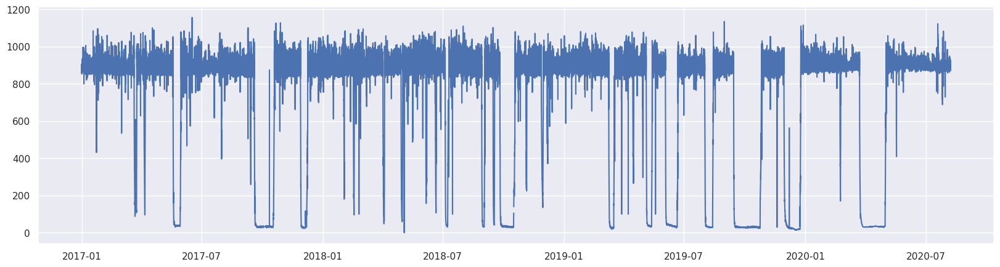

In [23]:
# Example
plt.figure(figsize=(20,5))
plt.plot(df['time_date'], df['Cyclone_Inlet_Gas_Temp'])
plt.show()

In [24]:
# Automation code with time
def plot_df_with_time(x,y):
    plt.figure(figsize=(20,5))
    plt.plot(x, y)
    plt.xlabel(x.name)
    plt.ylabel(y.name)
    plt.show()

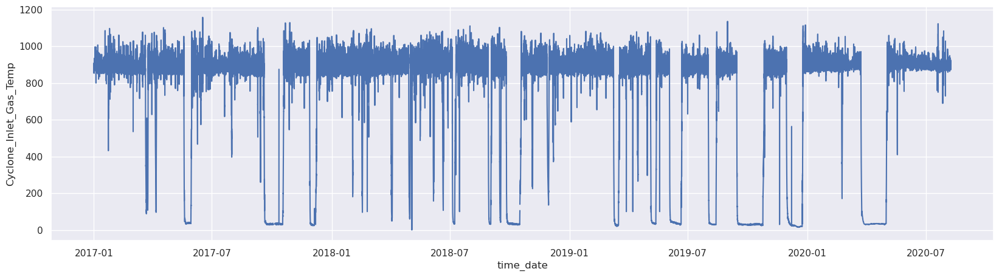

In [25]:
# time vs 'Cyclone_Inlet_Gas_Temp'
plot_df_with_time( df['time_date'], df['Cyclone_Inlet_Gas_Temp'])

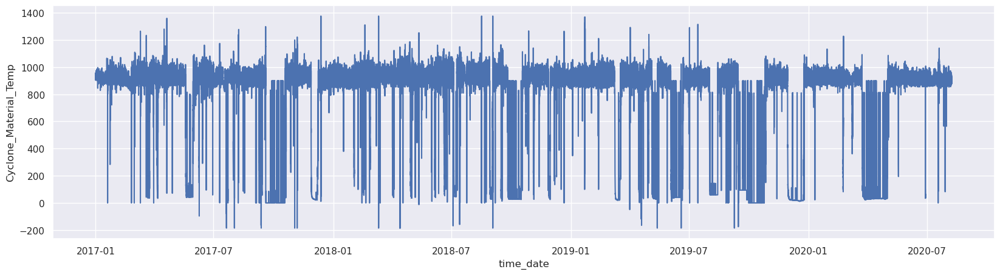

In [26]:
plot_df_with_time(df['time_date'], df['Cyclone_Material_Temp'])

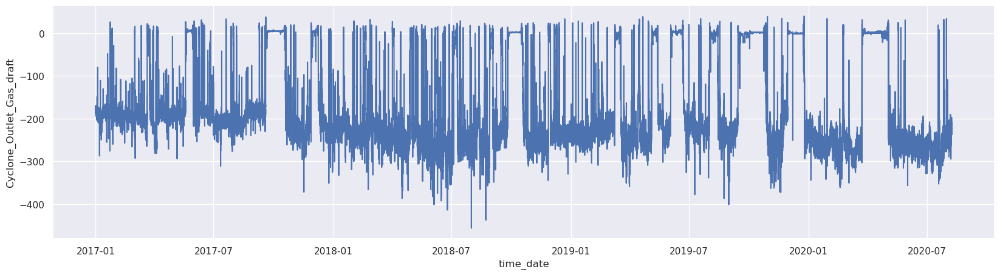

In [27]:
plot_df_with_time(df['time_date'] ,df['Cyclone_Outlet_Gas_draft'])

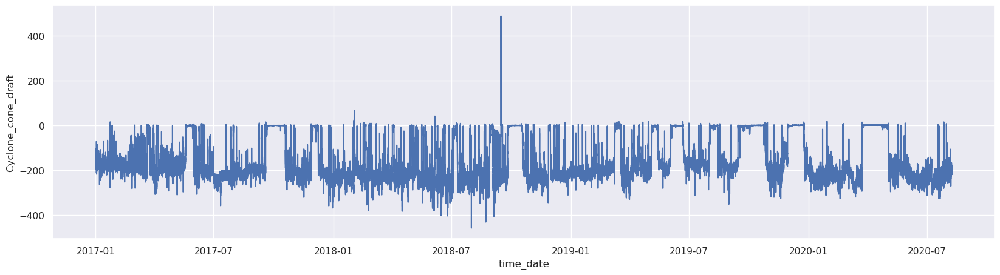

In [28]:
plot_df_with_time(df['time_date'], df['Cyclone_cone_draft'])

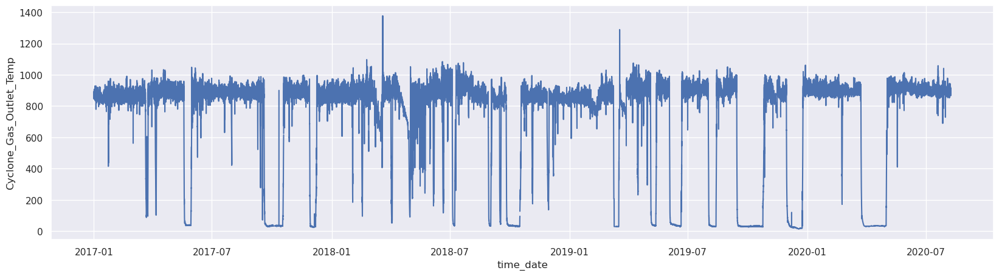

In [29]:
plot_df_with_time(df['time_date'], df['Cyclone_Gas_Outlet_Temp'])

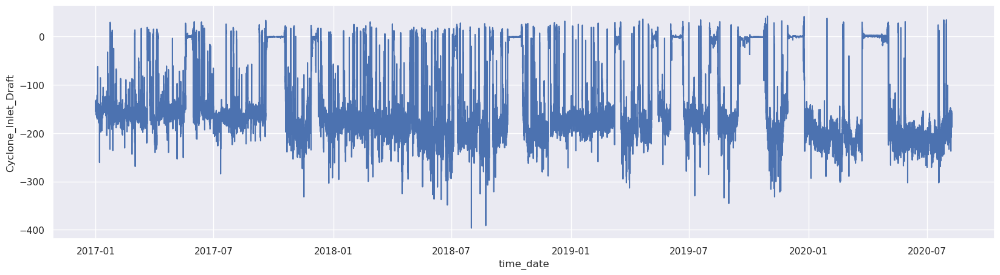

In [30]:
plot_df_with_time(df['time_date'], df['Cyclone_Inlet_Draft'])

In [31]:
# Automated boxplot 
def boxplot_df(x):
    plt.figure(figsize = [12,5])
    sns.boxplot(x = x, orient= 'V', saturation=0.75)
    plt.show()

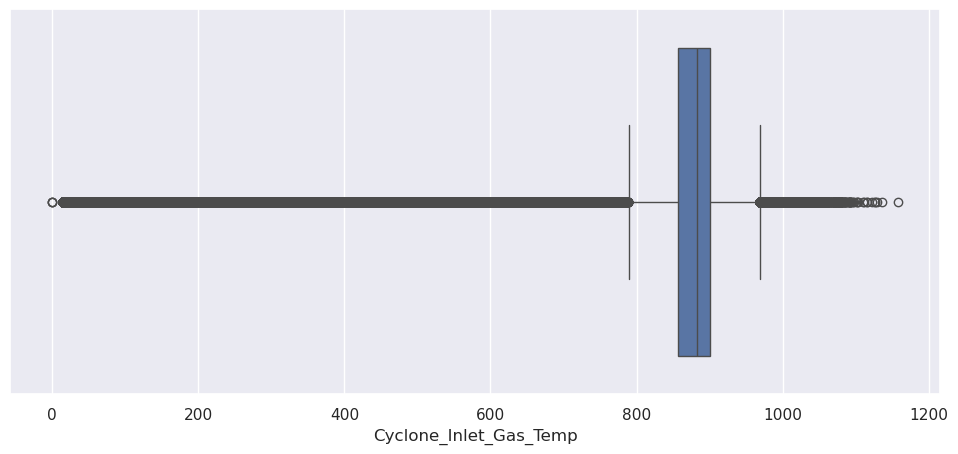

In [32]:
boxplot_df(df['Cyclone_Inlet_Gas_Temp'])

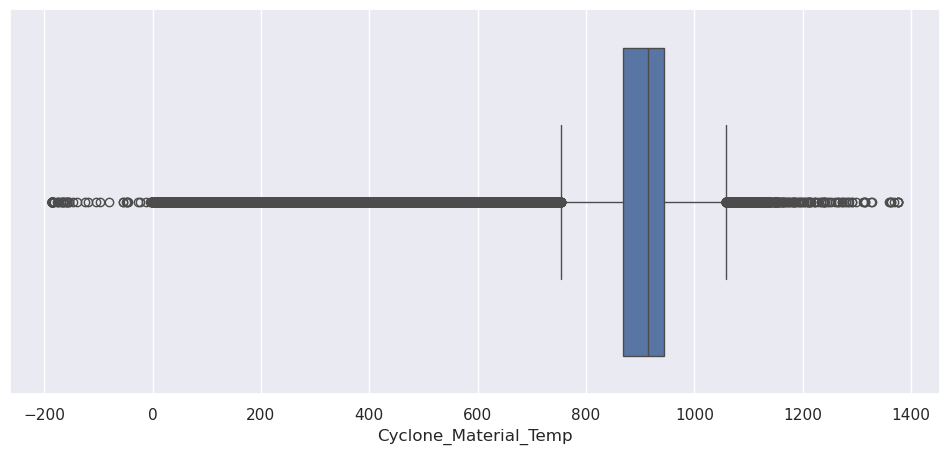

In [33]:
boxplot_df(df['Cyclone_Material_Temp'])

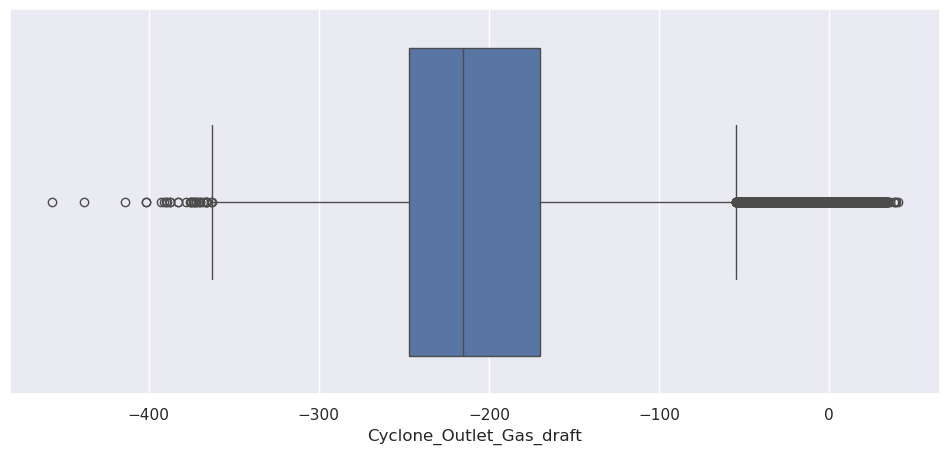

In [34]:
boxplot_df(df['Cyclone_Outlet_Gas_draft'])

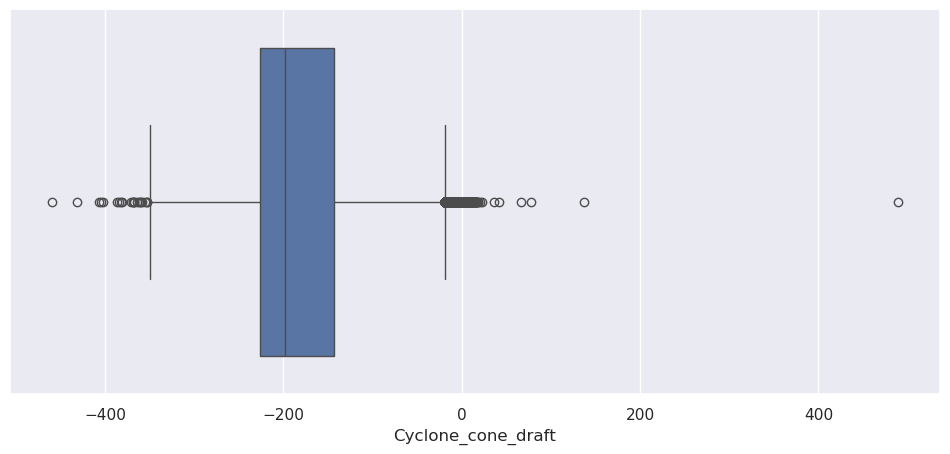

In [35]:
boxplot_df(df['Cyclone_cone_draft'])

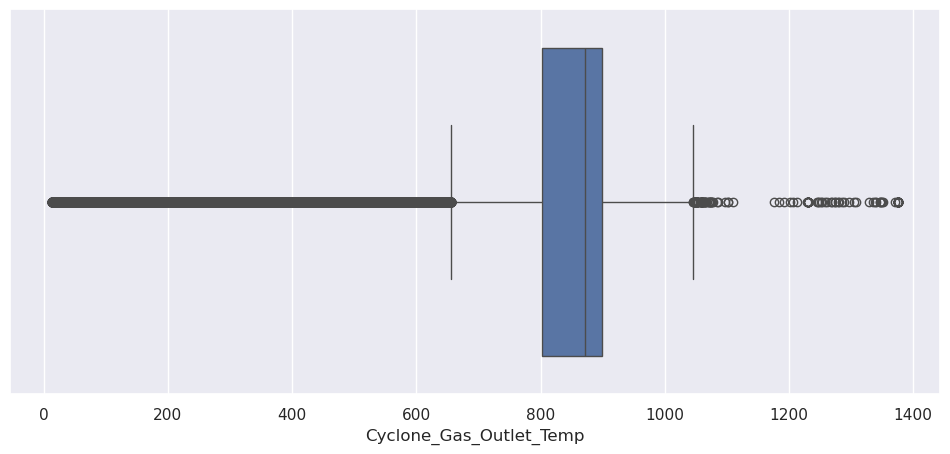

In [36]:
boxplot_df(df['Cyclone_Gas_Outlet_Temp'])

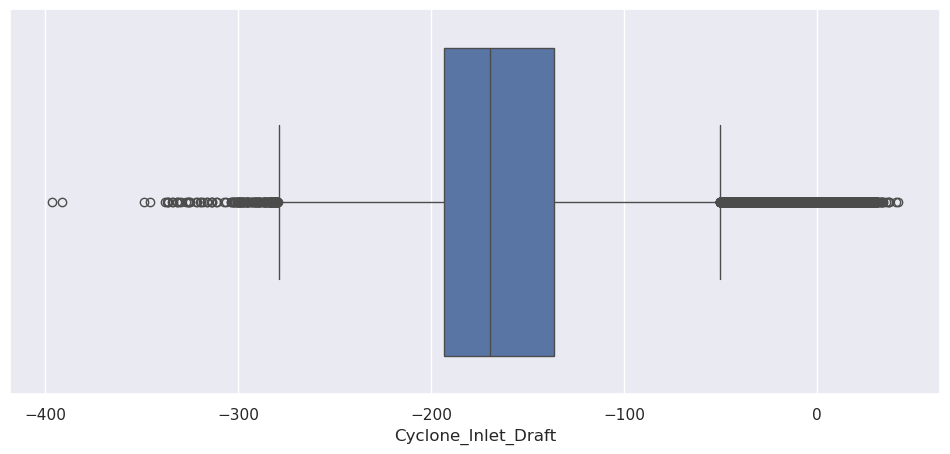

In [37]:
boxplot_df(df['Cyclone_Inlet_Draft'])

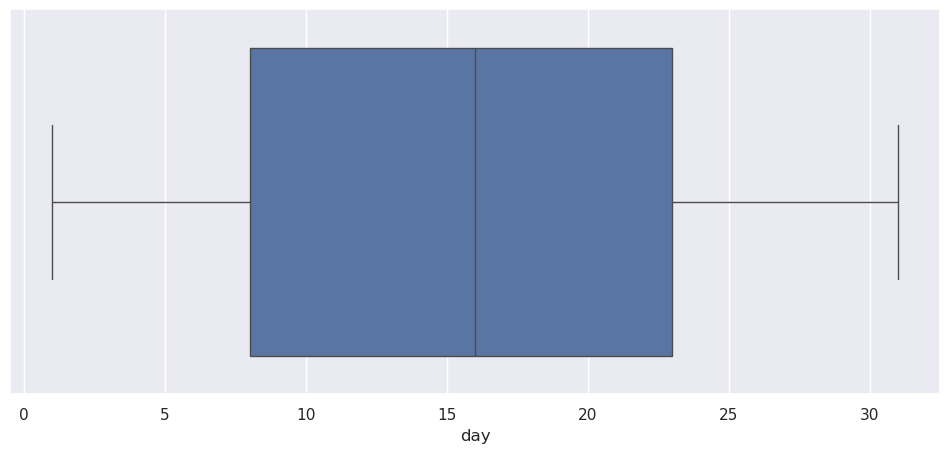

In [38]:
boxplot_df(df['day'])

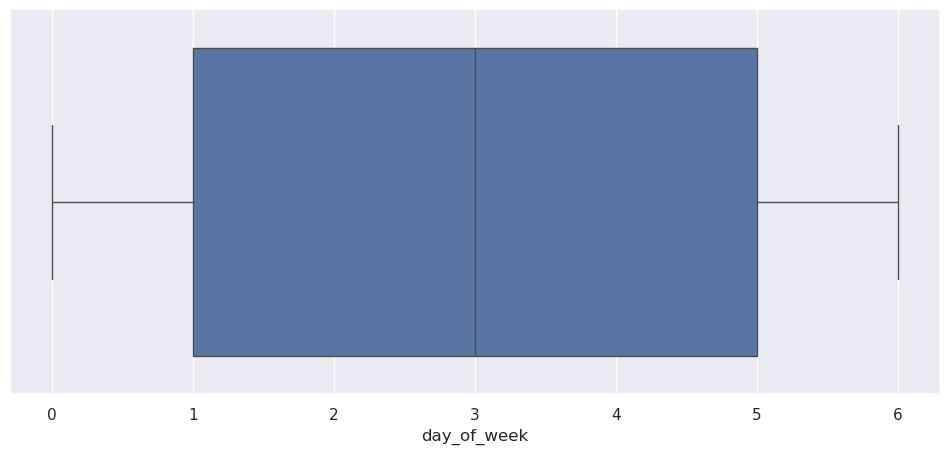

In [39]:
boxplot_df(df['day_of_week'])

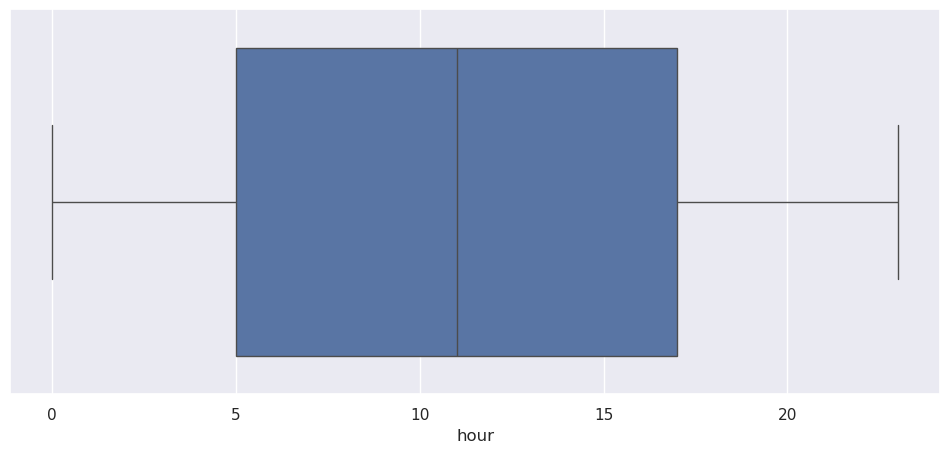

In [40]:
boxplot_df(df['hour'])

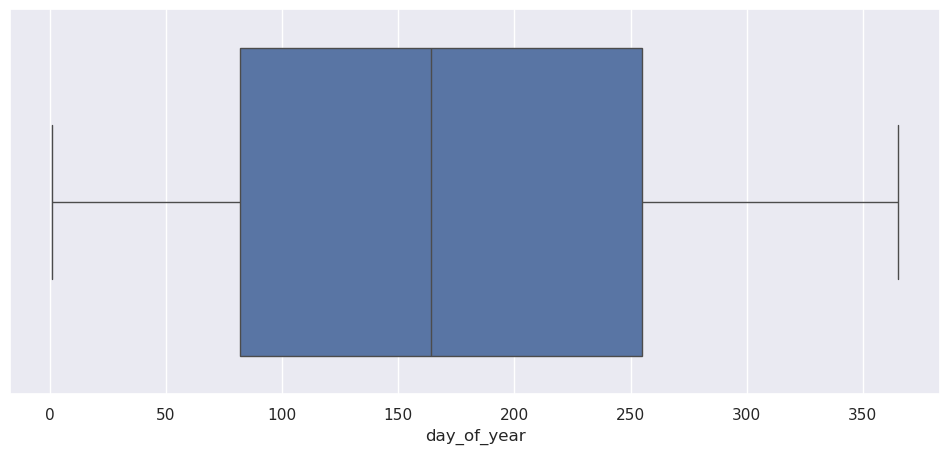

In [41]:
boxplot_df(df['day_of_year'])

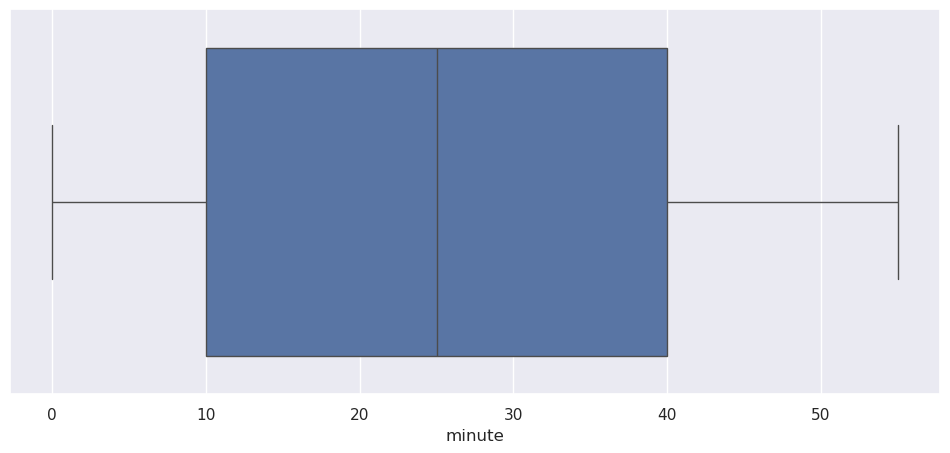

In [42]:
boxplot_df(df['minute'])

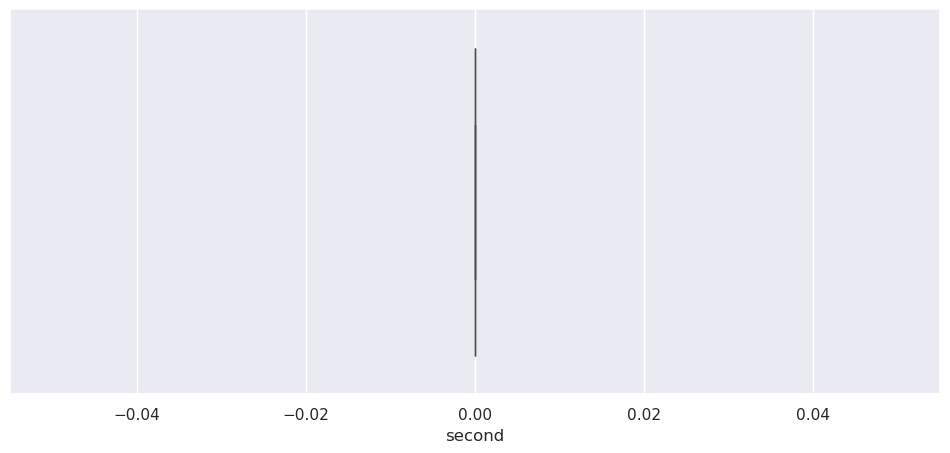

In [43]:
boxplot_df(df['second'])

In [44]:
def qq_plot(x):
    scipy.stats.probplot(x,plot=plt)
    plt.show()

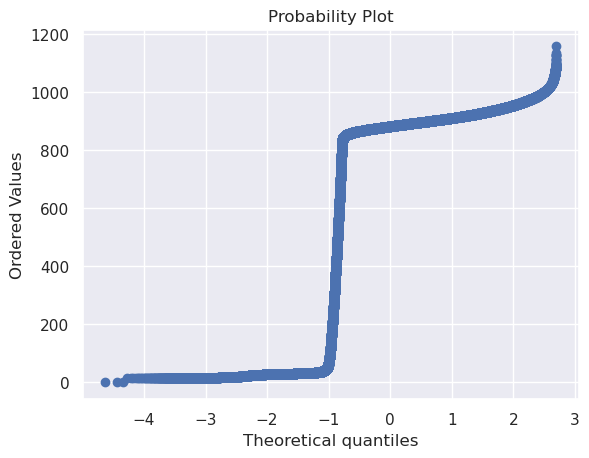

In [45]:
qq_plot(df['Cyclone_Inlet_Gas_Temp'])

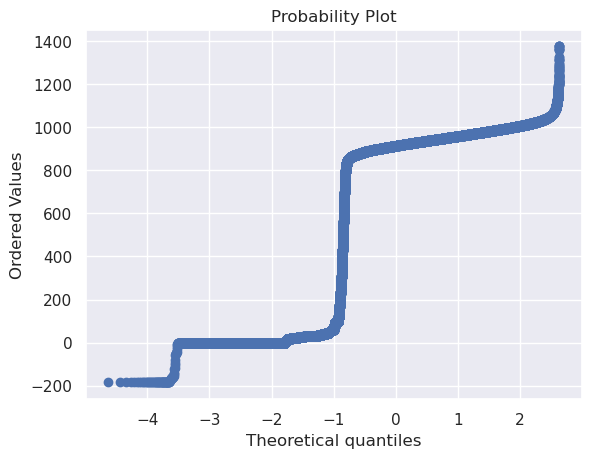

In [46]:
qq_plot(df['Cyclone_Material_Temp'])

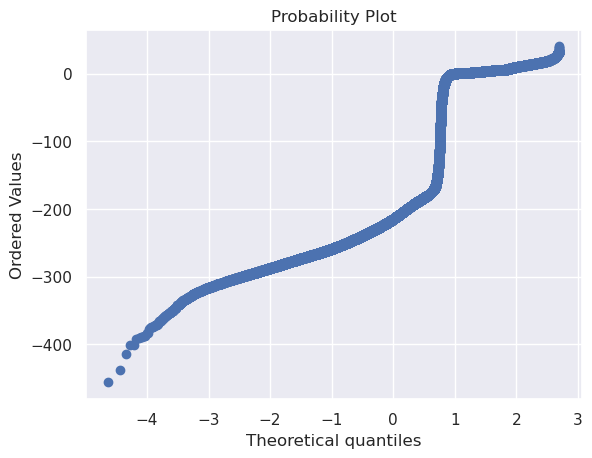

In [47]:
qq_plot(df['Cyclone_Outlet_Gas_draft'])

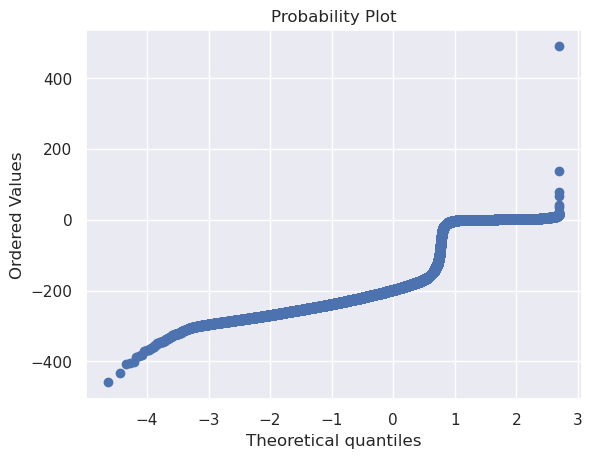

In [48]:
qq_plot(df['Cyclone_cone_draft'])

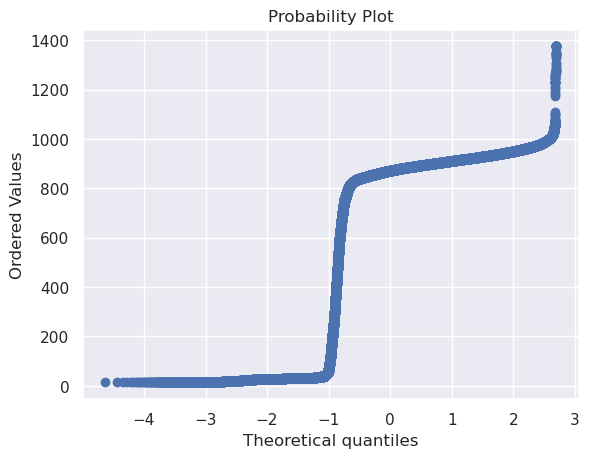

In [49]:
qq_plot(df['Cyclone_Gas_Outlet_Temp'])

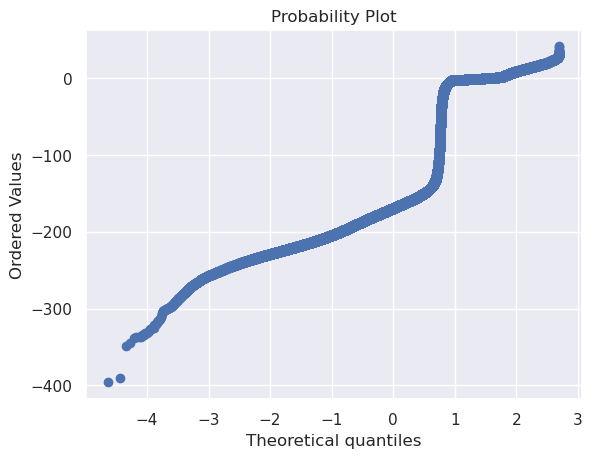

In [50]:
qq_plot(df['Cyclone_Inlet_Draft'])

In [51]:
# my visualization is complete 
# so i decide to fill null using method 'median'
df.fillna(df.median(), inplace=True)

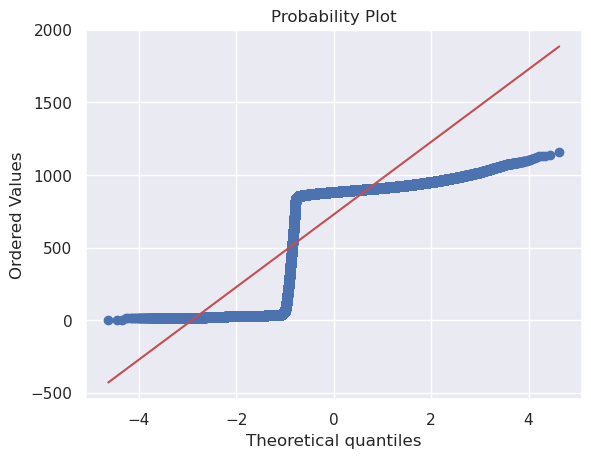

In [52]:
qq_plot(df['Cyclone_Inlet_Gas_Temp'])

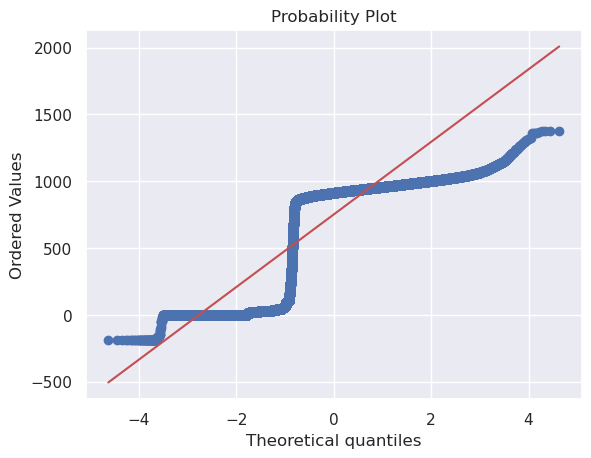

In [53]:
qq_plot(df['Cyclone_Material_Temp'])

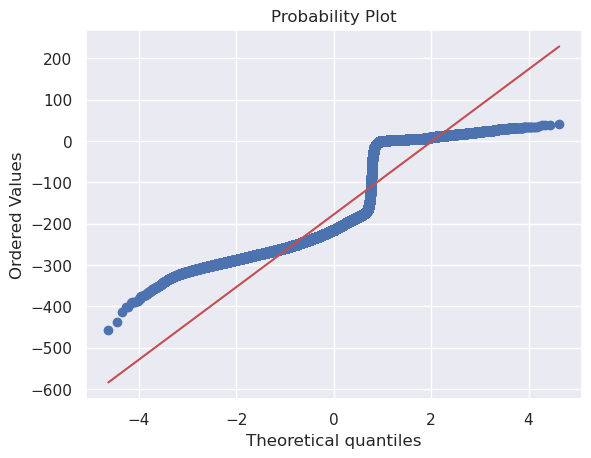

In [54]:
qq_plot(df['Cyclone_Outlet_Gas_draft'])

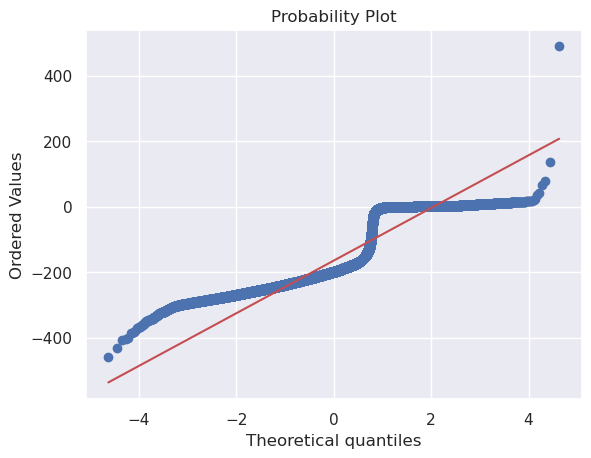

In [55]:
qq_plot(df['Cyclone_cone_draft'])

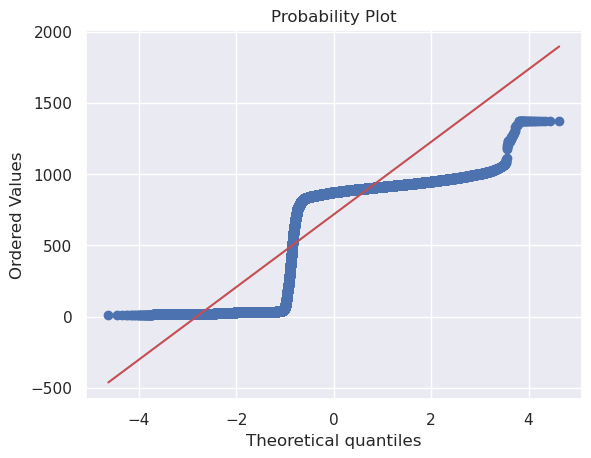

In [56]:
qq_plot(df['Cyclone_Gas_Outlet_Temp'])

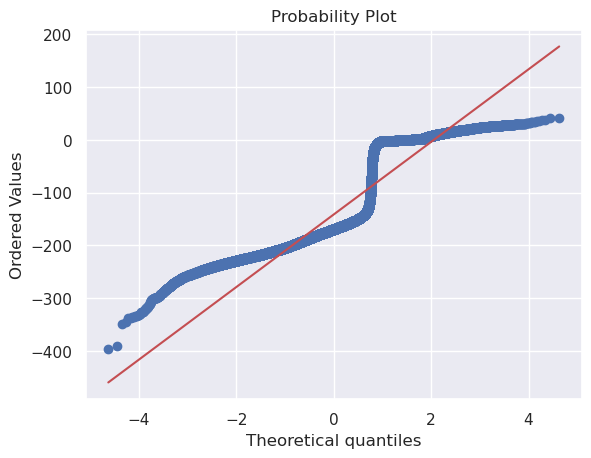

In [57]:
qq_plot(df['Cyclone_Inlet_Draft'])

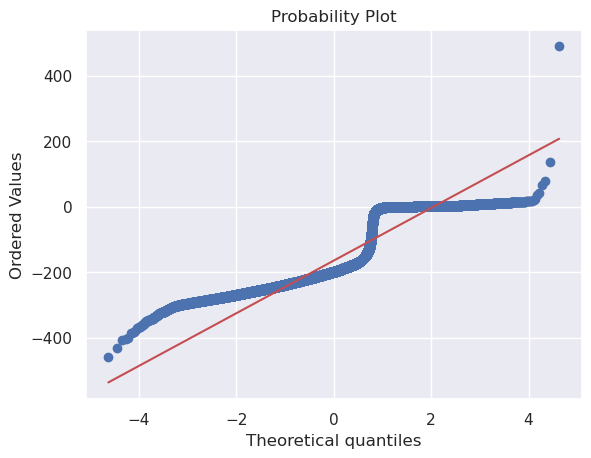

In [58]:
qq_plot(df['Cyclone_cone_draft'])

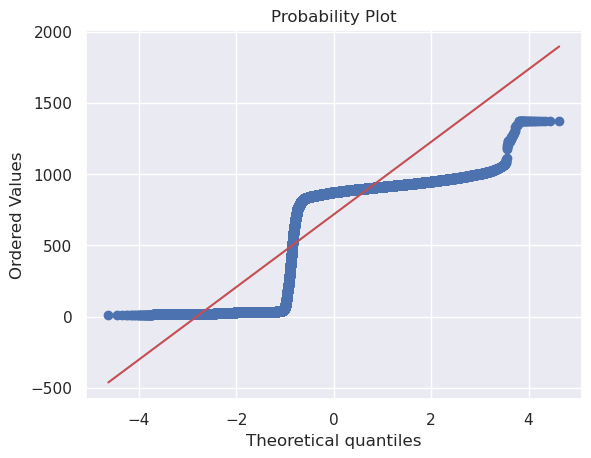

In [59]:
qq_plot(df['Cyclone_Gas_Outlet_Temp'])

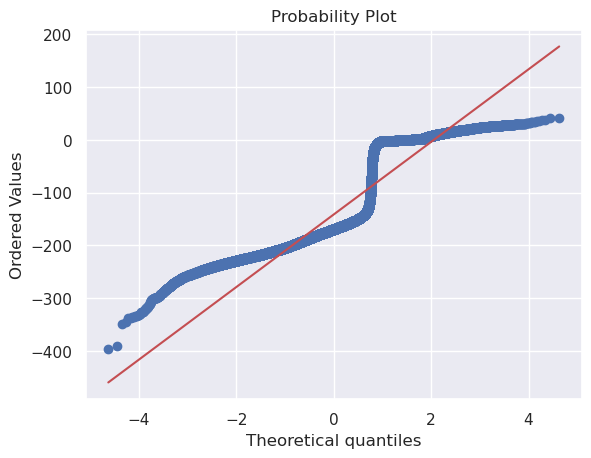

In [60]:
qq_plot(df['Cyclone_Inlet_Draft'])

<AxesSubplot: >

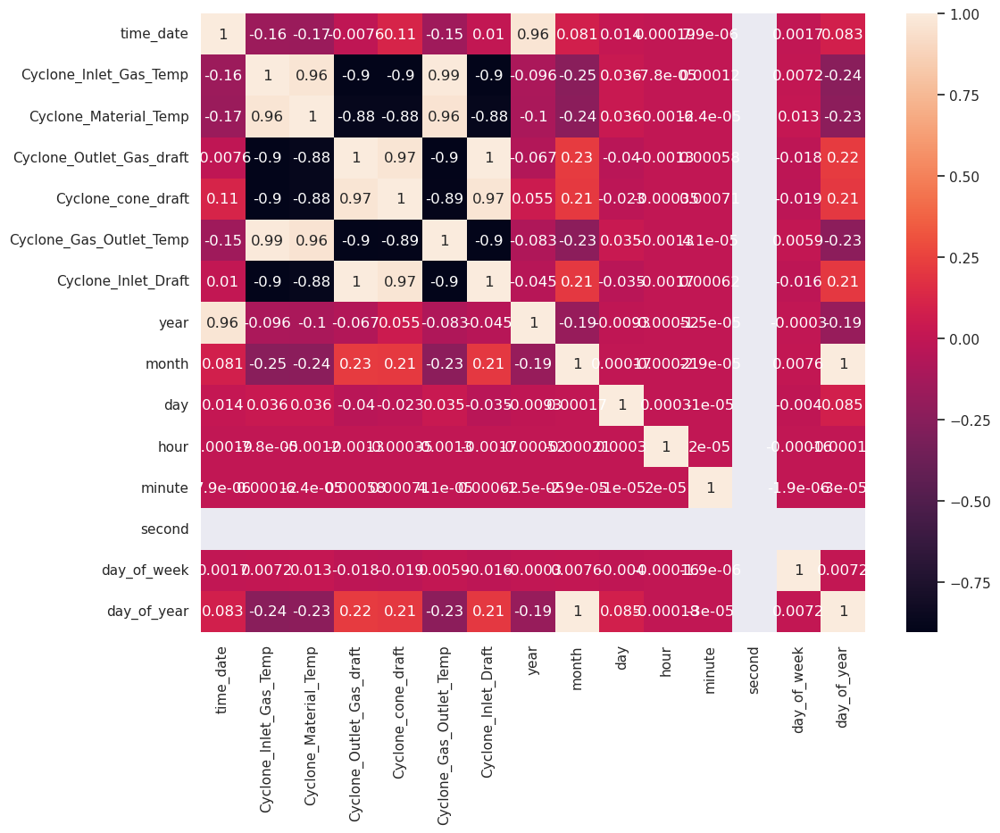

In [61]:
# Correlatio plots 
plt.figure(figsize=[12, 9])
sns.heatmap(df.corr(), annot=True)

Feature Engineering

### Abnormalities detection Model

Eliptic Envolope

Isolation Forest Model

In [66]:
# Isolation forest model
df_temp = df.copy()
from sklearn.ensemble import IsolationForest

X = df[cols]
scaler = StandardScaler()
X[cols] = scaler.fit_transform(X[cols])

outliers_fraction = 0.05

model =  IsolationForest(contamination = outliers_fraction, n_jobs=-1)
model.fit(X)

# Add variable in temp datasets
df_temp['anomaly_isolation_forest'] = pd.Series(model.predict(X))
df_temp['anomaly_isolation_forest'] = df_temp['anomaly_isolation_forest']

df_temp['anomaly_isolation_forest'].value_counts()

/tmp/ipykernel_223480/2281625094.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[cols] = scaler.fit_transform(X[cols])


anomaly_isolation_forest
 1    358833
-1     18886
Name: count, dtype: int64

In [67]:
# Automation plots
def plot_isolation_forest(x, y):
    col = y      
    x1 = df_temp[[x, col]]
    x2 = df_temp.loc[df_temp['anomaly_isolation_forest'] == -1, [x, col]]

    plt.figure(figsize = [18, 8])
    sns.lineplot(x = x1[x], y = x1[col], alpha = 0.9)
    sns.scatterplot(x = x2[x], y = x2[col], s = 50, color = 'red', alpha = 0.5)
    plt.axhline((df_temp[col].mean() - 1.960 * df_temp[col].std()), ls="--", c="g")
    plt.axhline((df_temp[col].mean() + 1.960 * df_temp[col].std()), ls="--", c="g")
    plt.legend()
    plt.title(f'Abnormality {x} vs {y}')
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


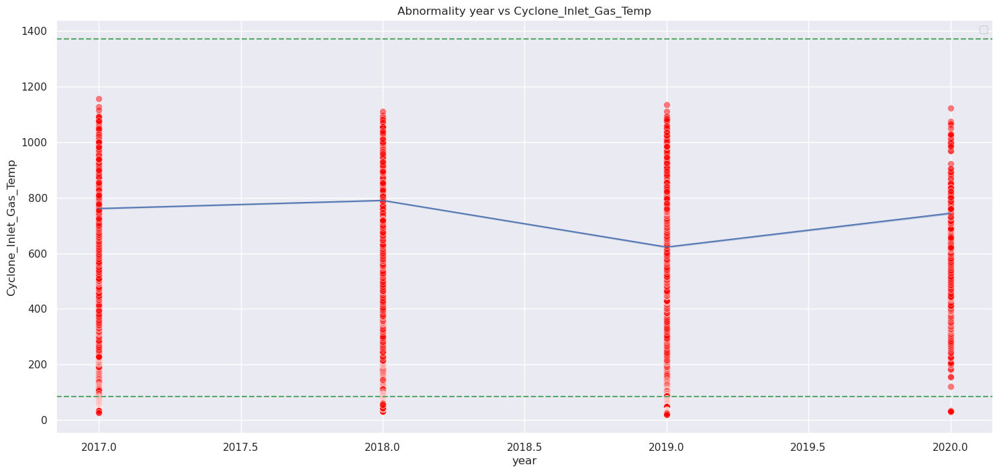

In [68]:
plot_isolation_forest('year','Cyclone_Inlet_Gas_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


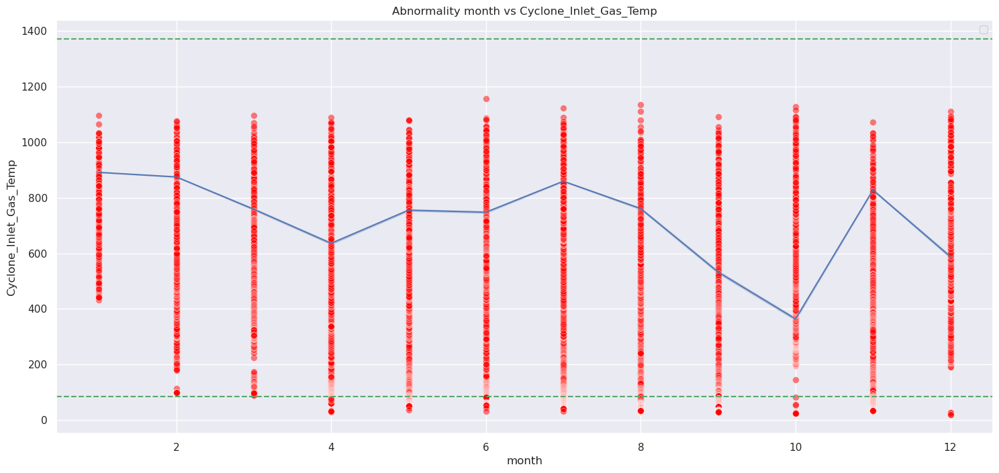

In [69]:
plot_isolation_forest('month','Cyclone_Inlet_Gas_Temp' )

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


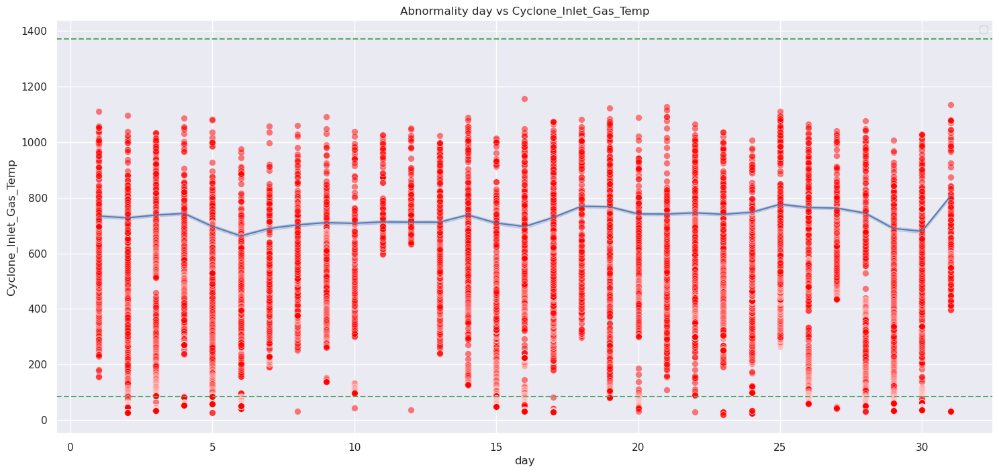

In [70]:
plot_isolation_forest('day','Cyclone_Inlet_Gas_Temp' )

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


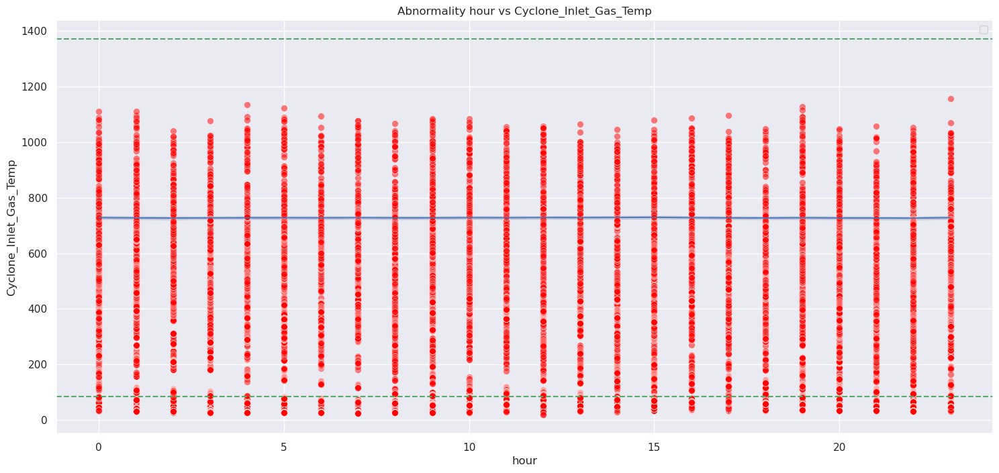

In [71]:
plot_isolation_forest('hour','Cyclone_Inlet_Gas_Temp' )

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


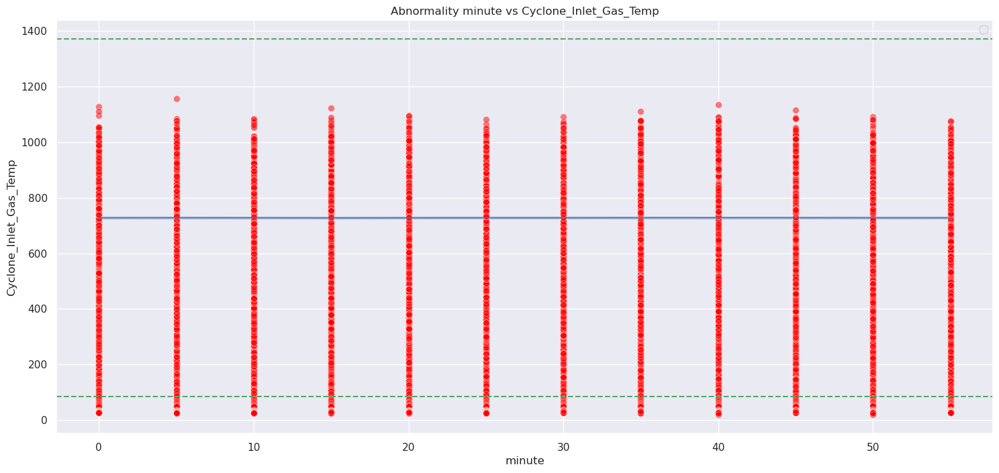

In [72]:
plot_isolation_forest('minute','Cyclone_Inlet_Gas_Temp' )

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


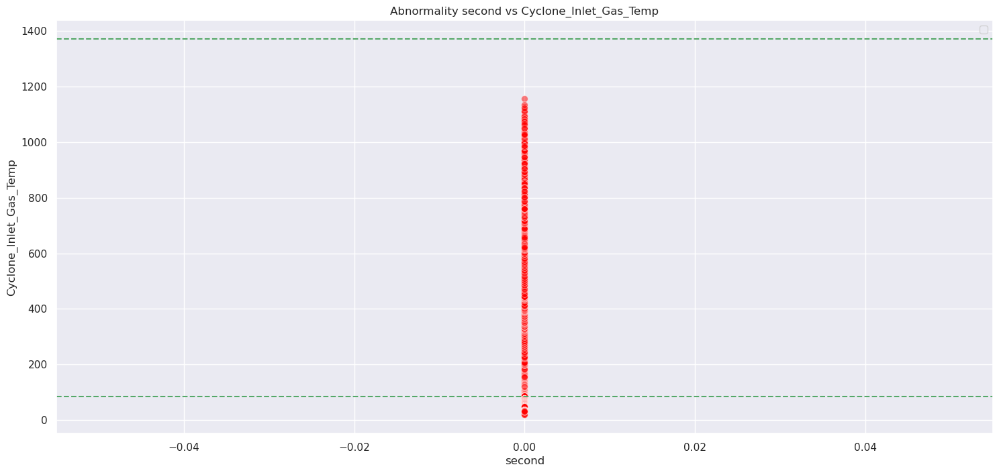

In [73]:
plot_isolation_forest('second','Cyclone_Inlet_Gas_Temp' )

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


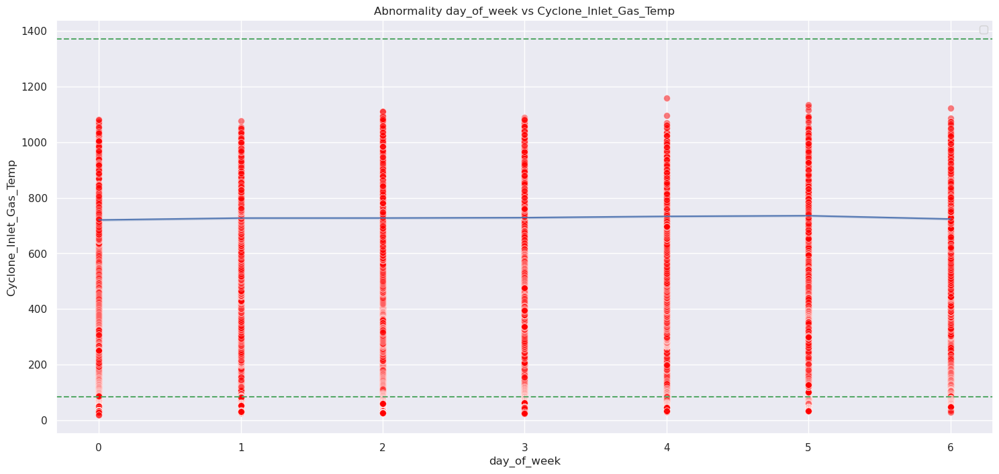

In [74]:
plot_isolation_forest('day_of_week','Cyclone_Inlet_Gas_Temp' )

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


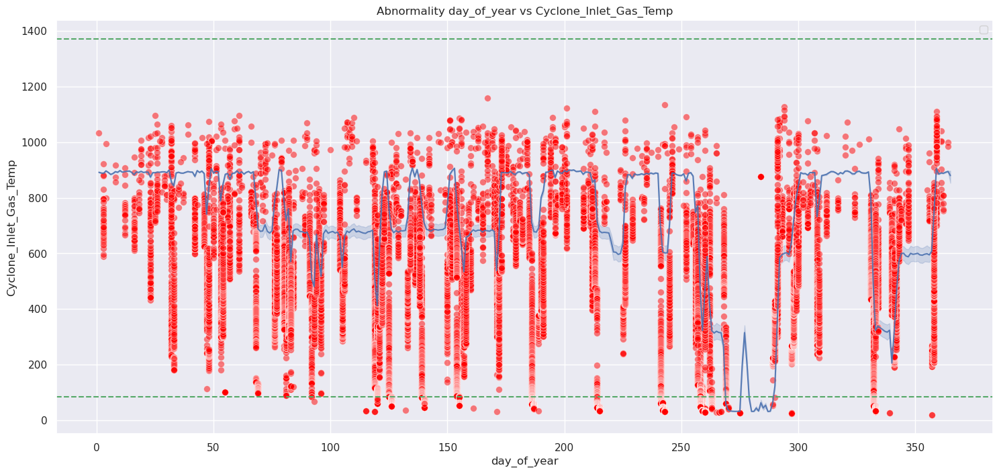

In [75]:
plot_isolation_forest('day_of_year','Cyclone_Inlet_Gas_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


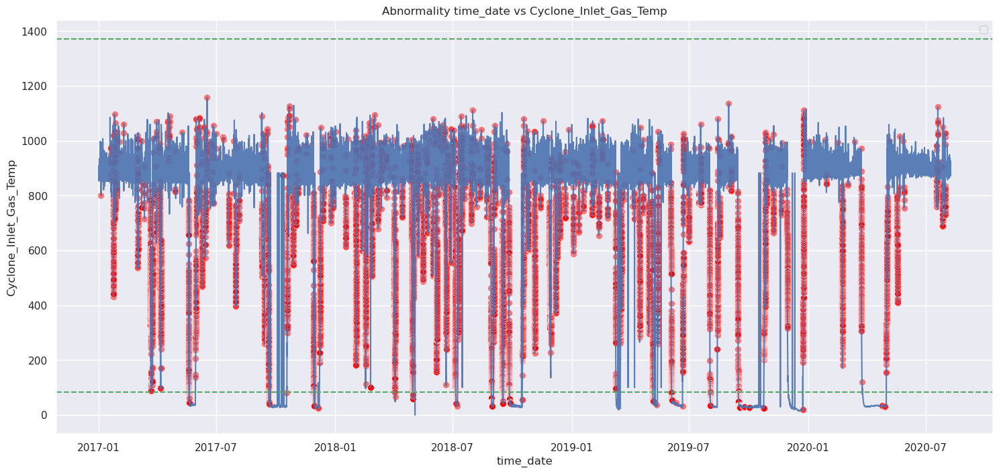

In [76]:
plot_isolation_forest('time_date' ,'Cyclone_Inlet_Gas_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


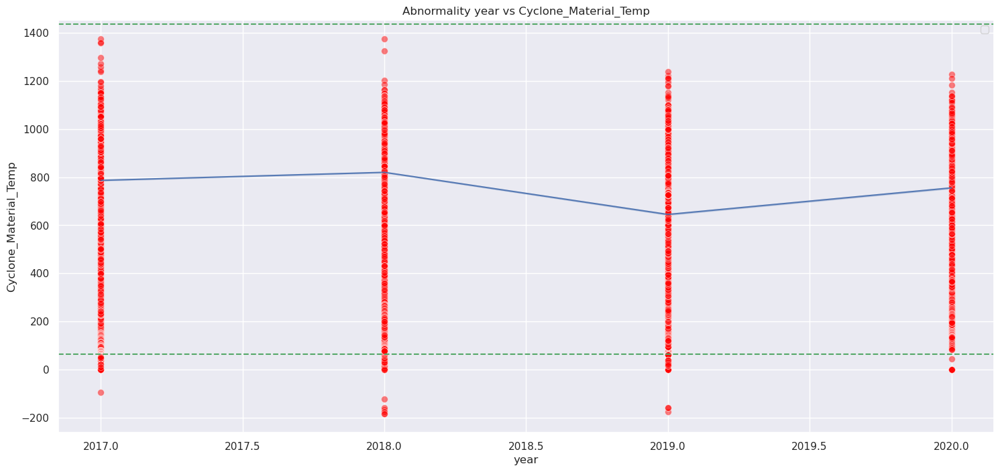

In [77]:
# 'Cyclone_Material_Temp'
plot_isolation_forest('year' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


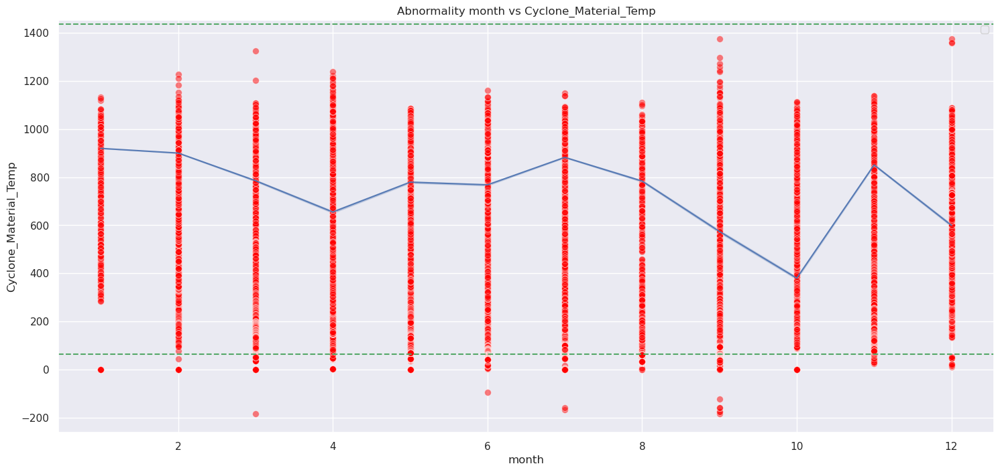

In [78]:
plot_isolation_forest('month' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


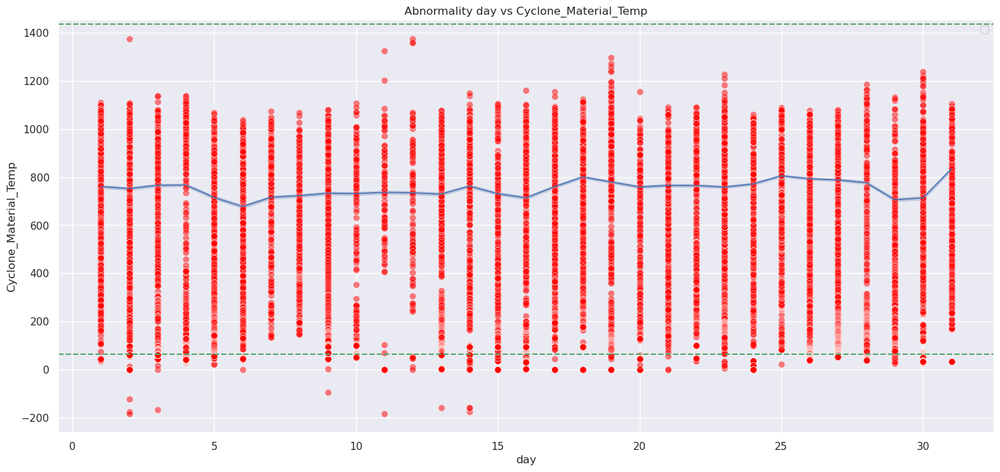

In [79]:
plot_isolation_forest('day' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


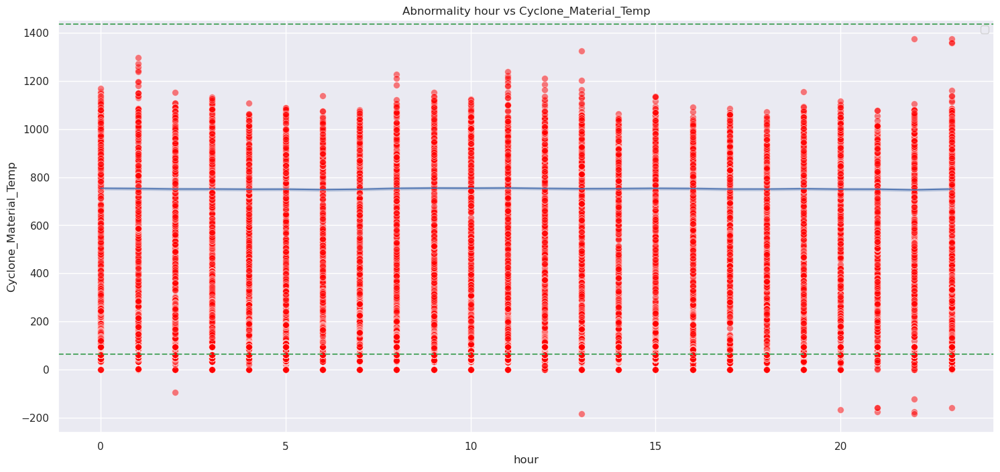

In [80]:
plot_isolation_forest('hour' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


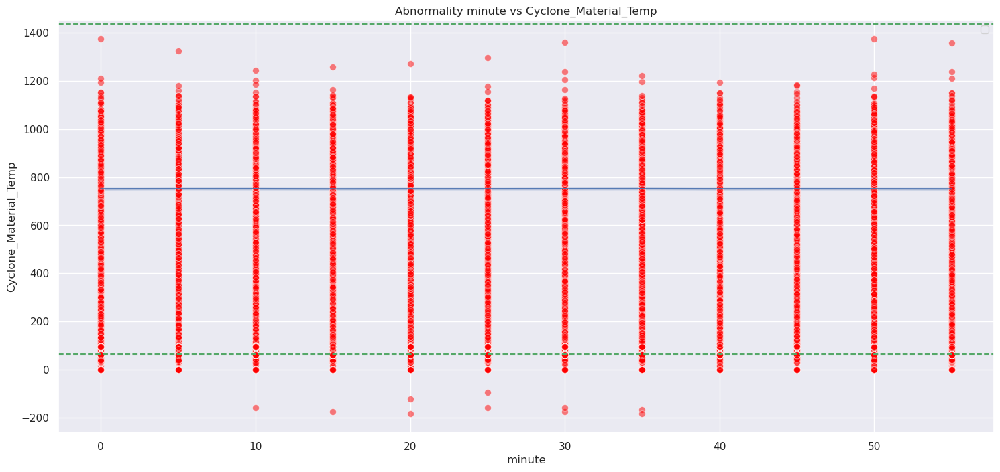

In [81]:
plot_isolation_forest('minute' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


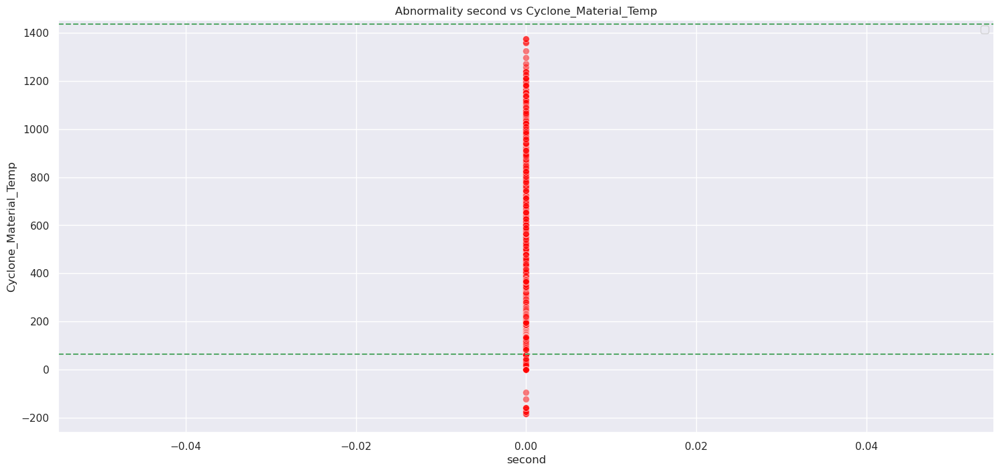

In [82]:
plot_isolation_forest('second' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


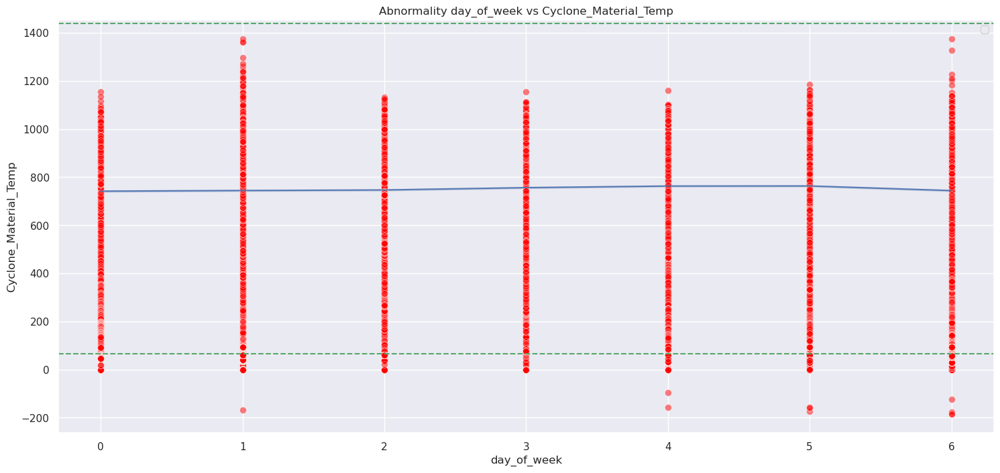

In [83]:
plot_isolation_forest('day_of_week' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


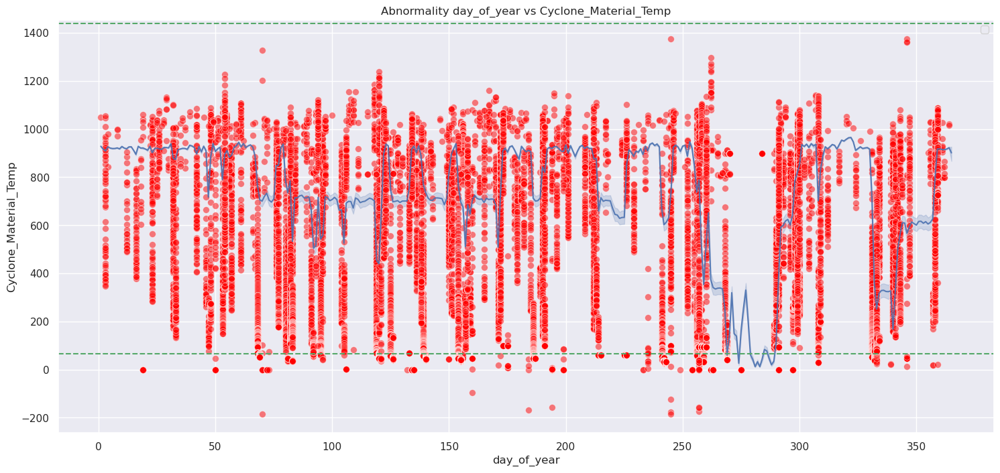

In [84]:
plot_isolation_forest('day_of_year' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


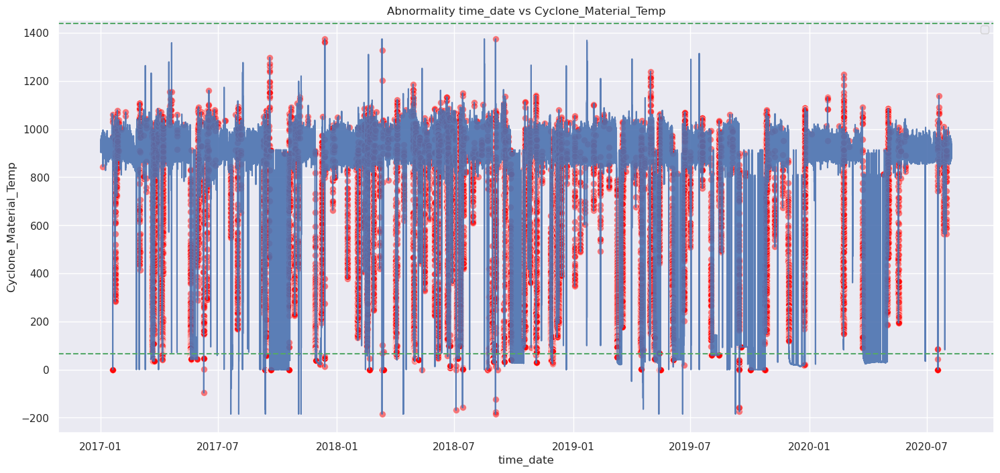

In [85]:
plot_isolation_forest('time_date' ,'Cyclone_Material_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


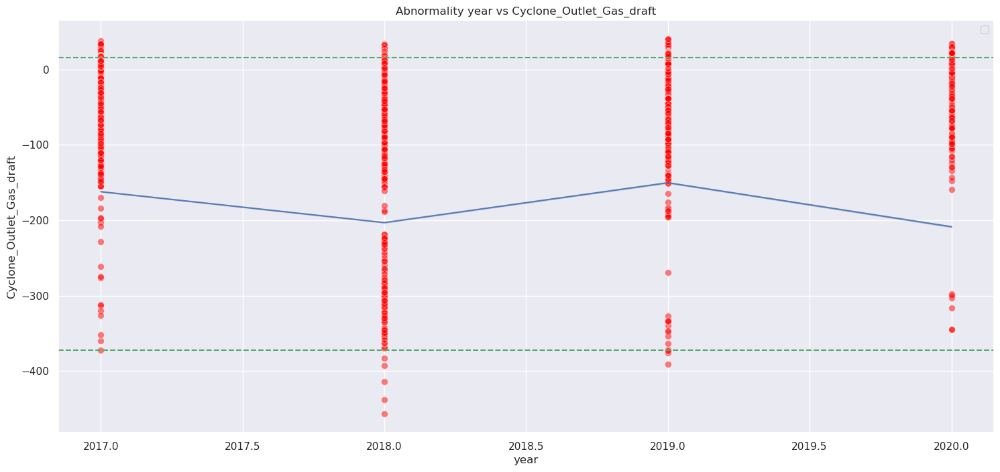

In [86]:
# 'Cyclone_Outlet_Gas_draft'
plot_isolation_forest('year' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


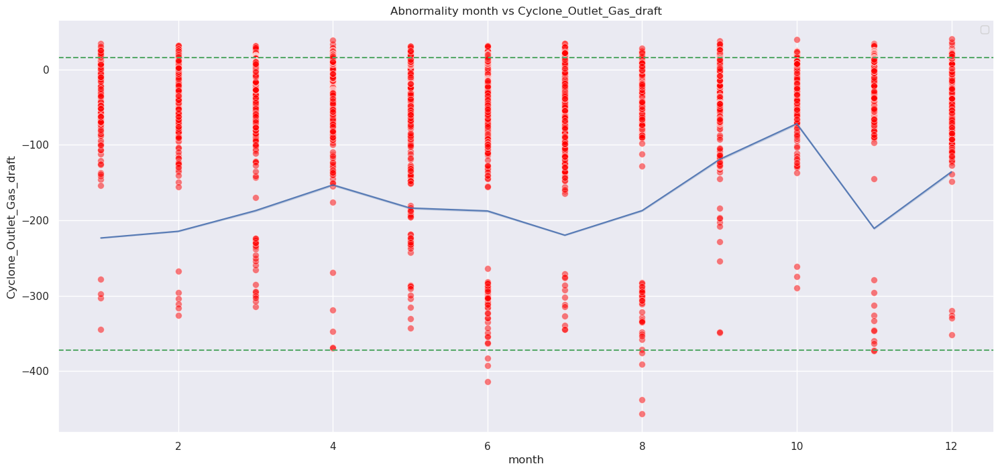

In [87]:
plot_isolation_forest('month' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


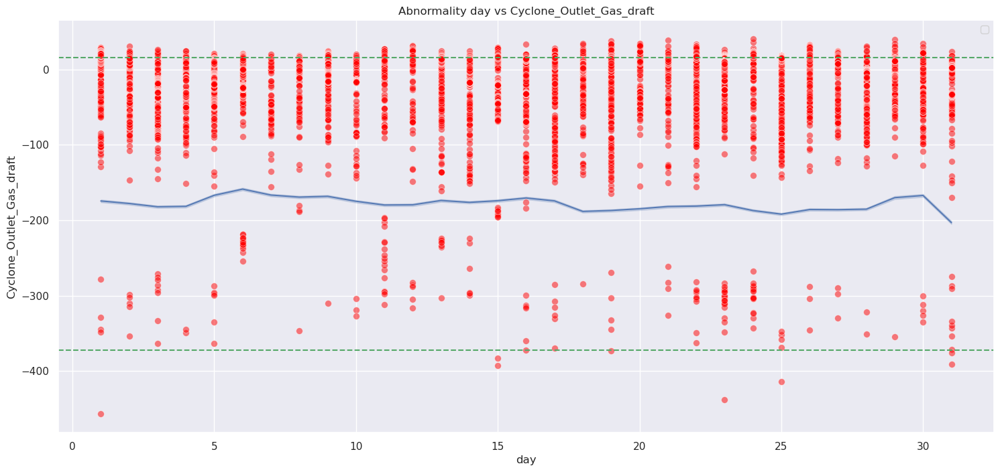

In [88]:
plot_isolation_forest('day' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


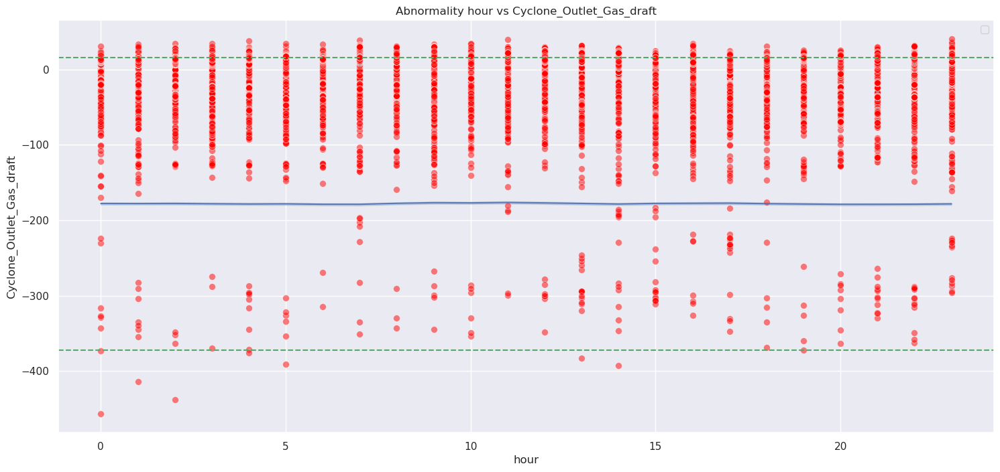

In [89]:
plot_isolation_forest('hour' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


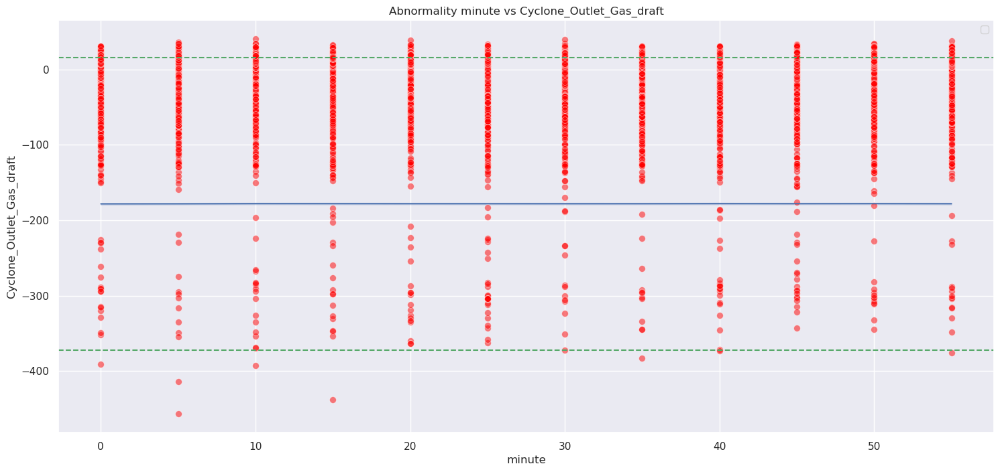

In [90]:
plot_isolation_forest('minute' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


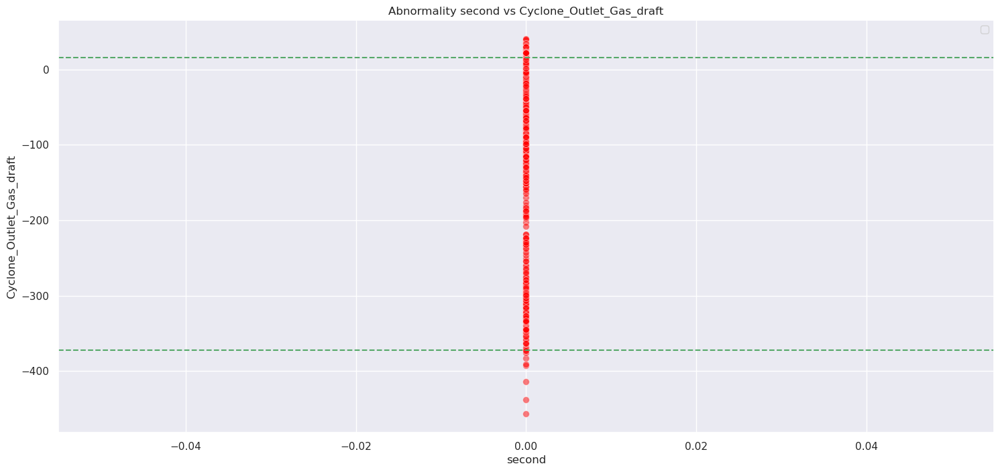

In [91]:
plot_isolation_forest('second' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


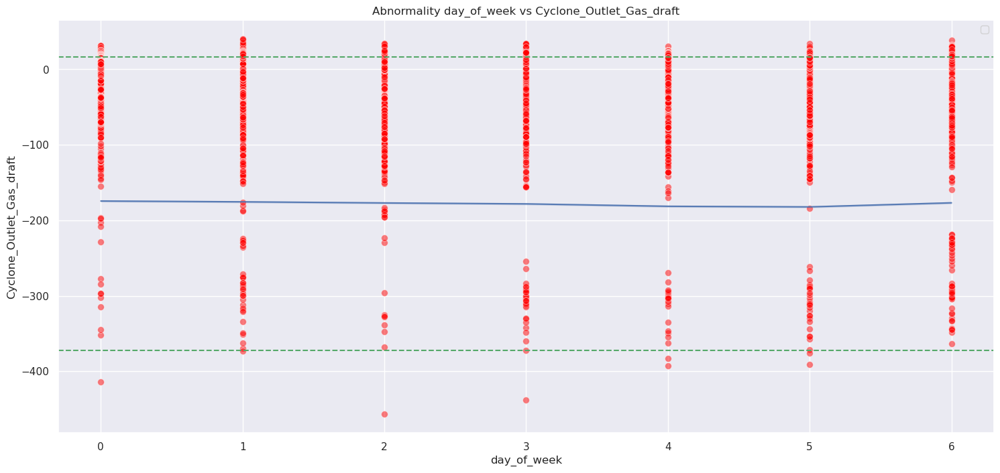

In [92]:
plot_isolation_forest('day_of_week' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


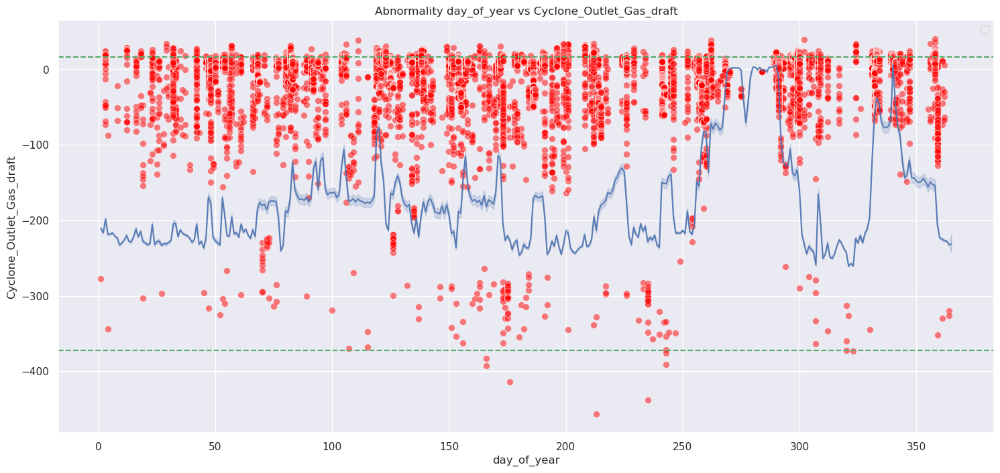

In [93]:
plot_isolation_forest('day_of_year' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


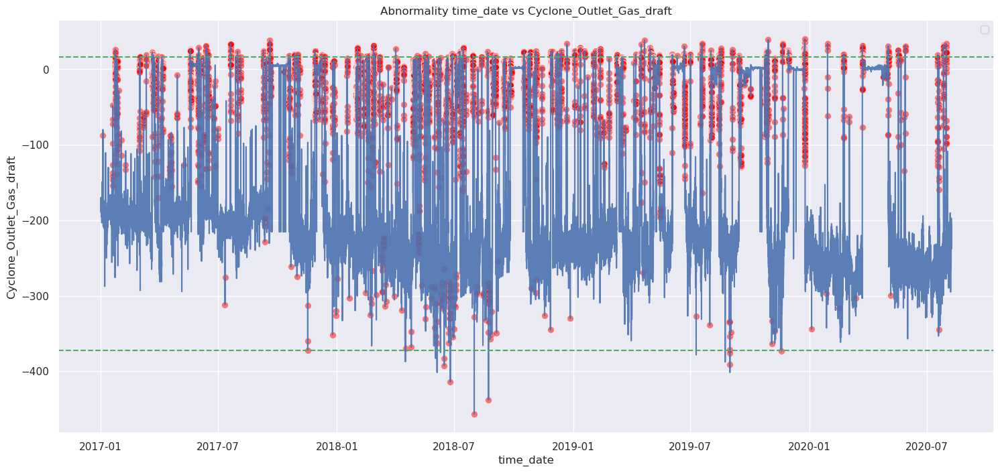

In [94]:
plot_isolation_forest('time_date' ,'Cyclone_Outlet_Gas_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


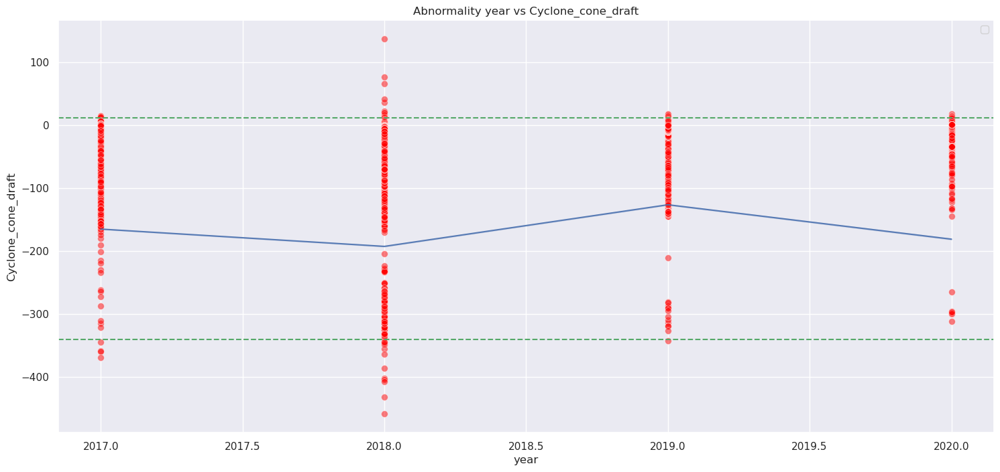

In [95]:
# 'Cyclone_cone_draft'
plot_isolation_forest('year' , 'Cyclone_cone_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


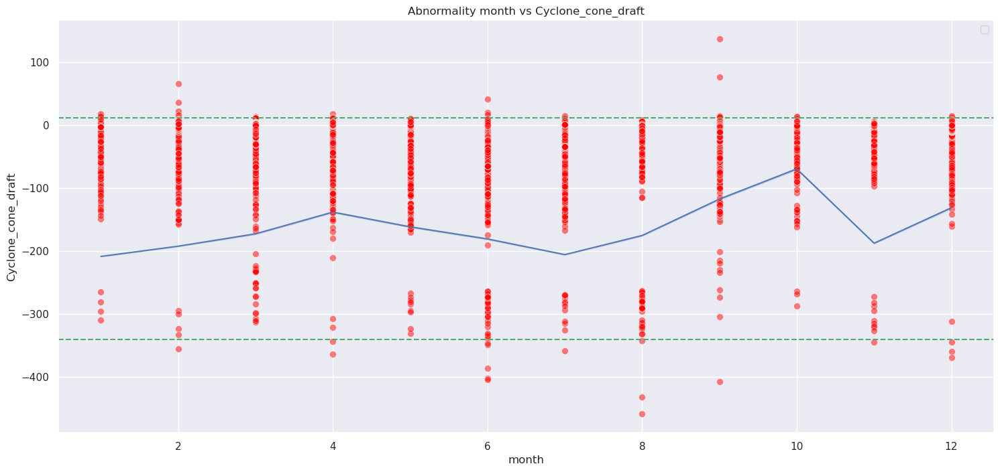

In [96]:
plot_isolation_forest('month' , 'Cyclone_cone_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


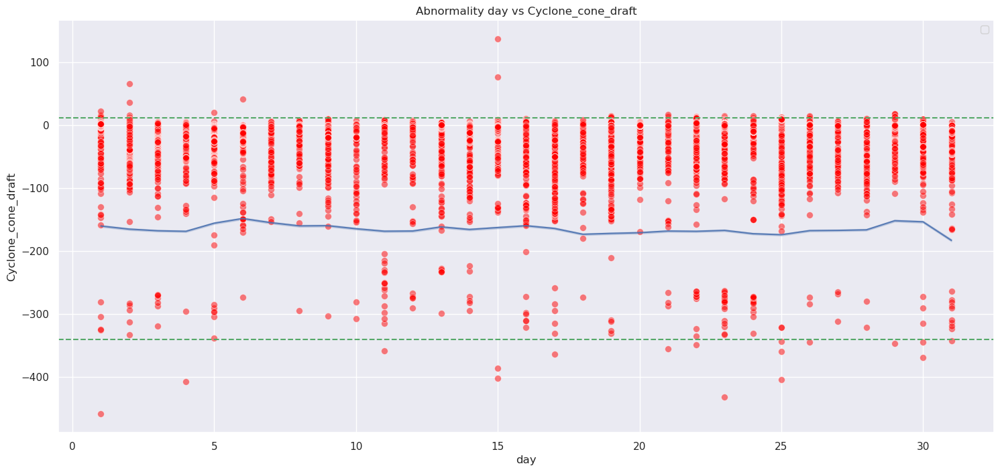

In [97]:
plot_isolation_forest('day' , 'Cyclone_cone_draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


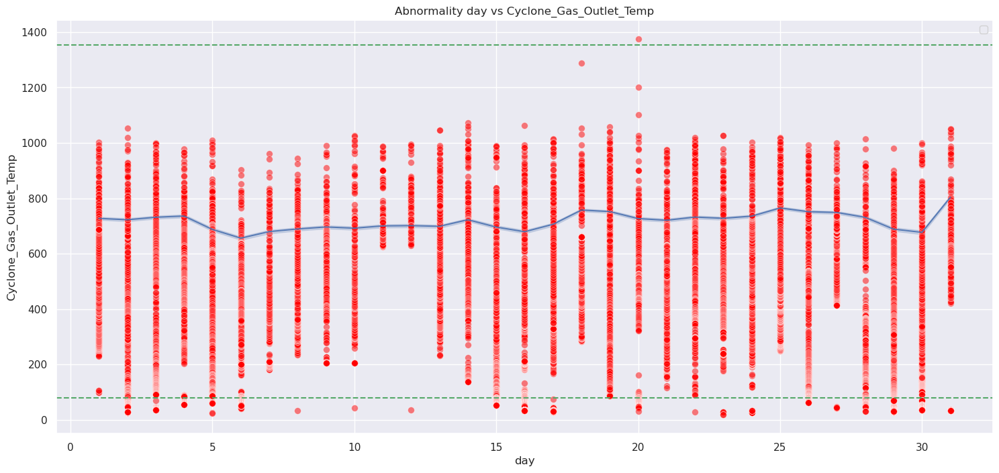

In [98]:
plot_isolation_forest('day' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


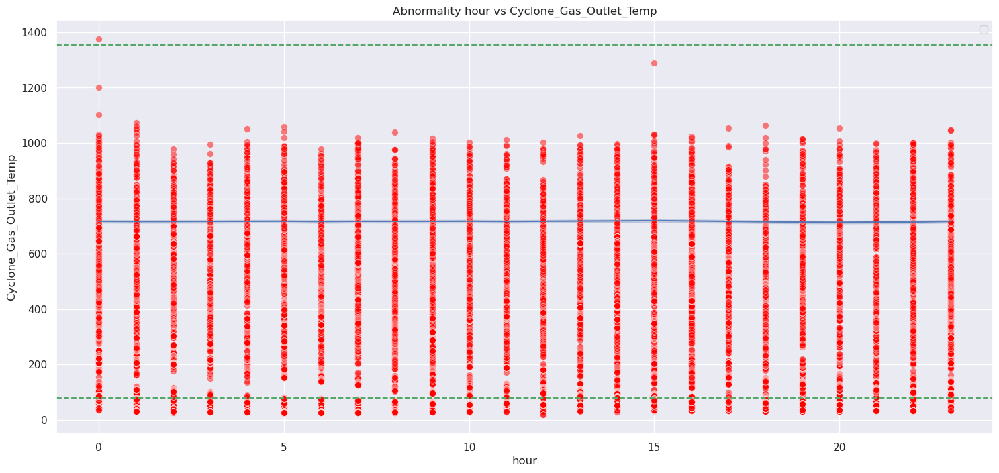

In [99]:
plot_isolation_forest('hour' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


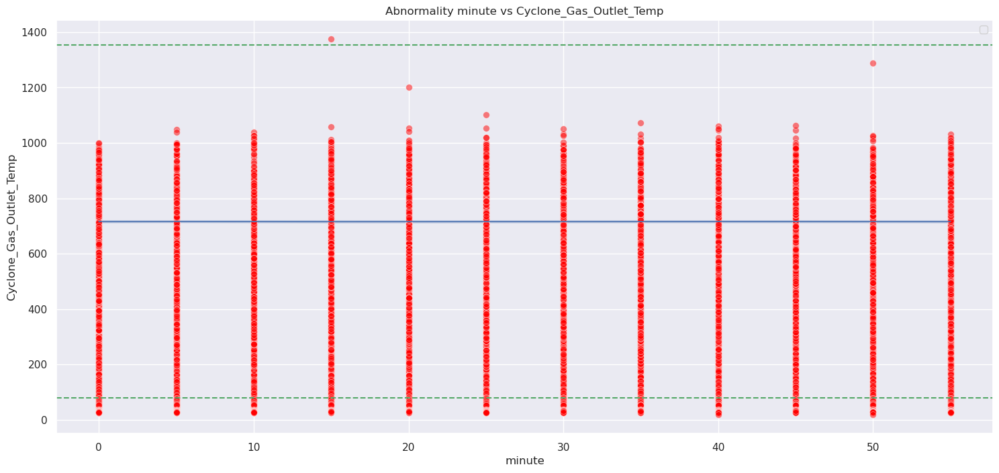

In [100]:
plot_isolation_forest('minute' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


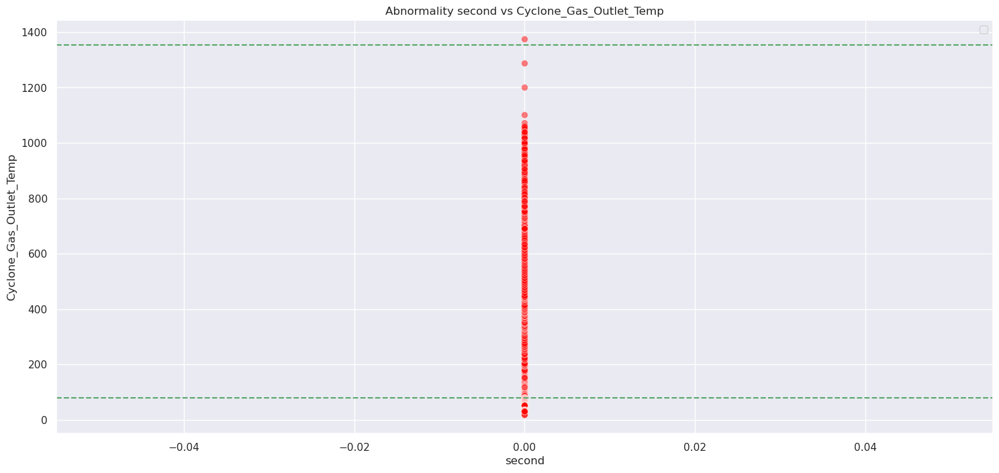

In [101]:
plot_isolation_forest('second' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


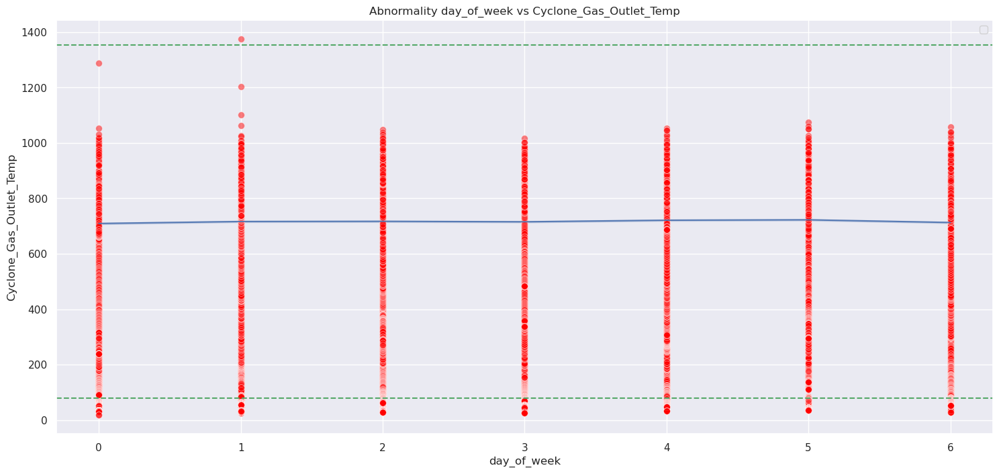

In [102]:
plot_isolation_forest('day_of_week' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


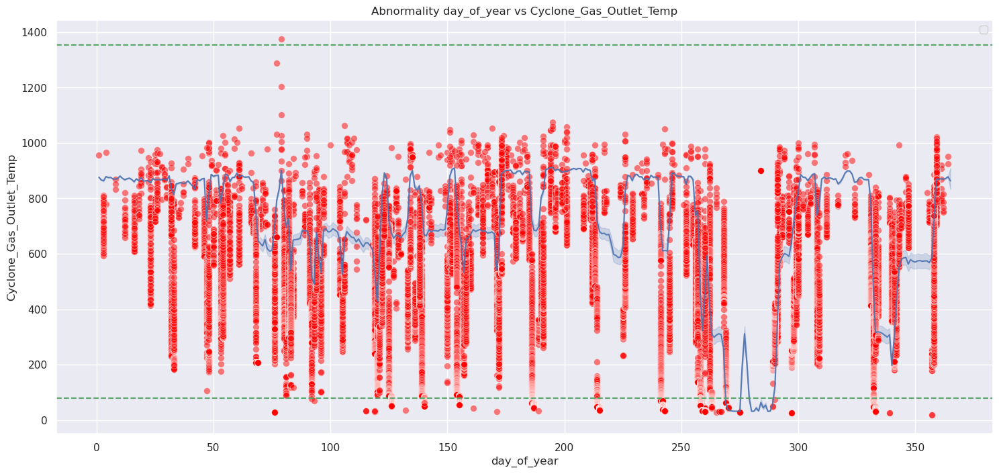

In [103]:
plot_isolation_forest( 'day_of_year' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


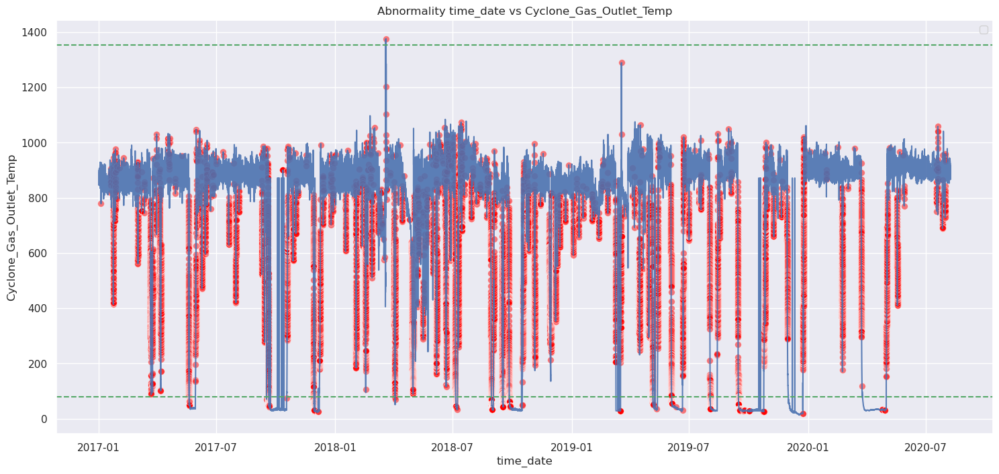

In [104]:
plot_isolation_forest('time_date' ,'Cyclone_Gas_Outlet_Temp')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


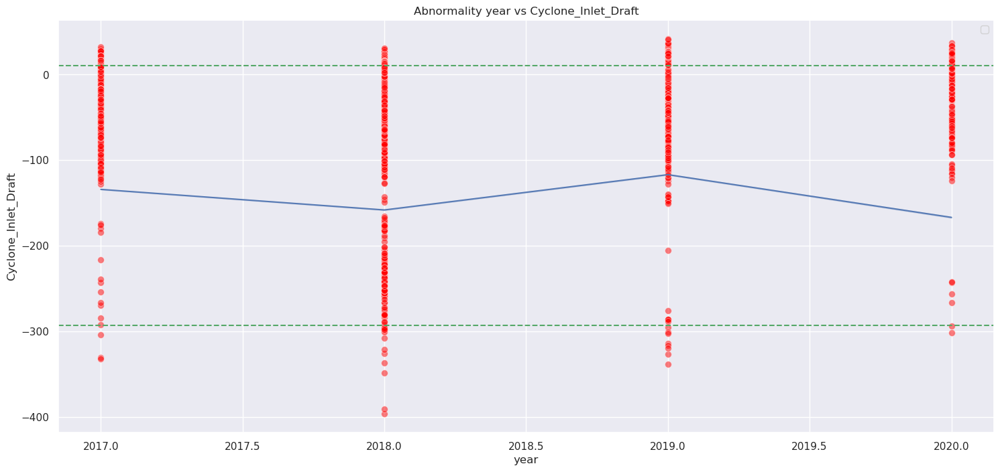

In [105]:
# 'Cyclone_Inlet_Draft'
plot_isolation_forest('year' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


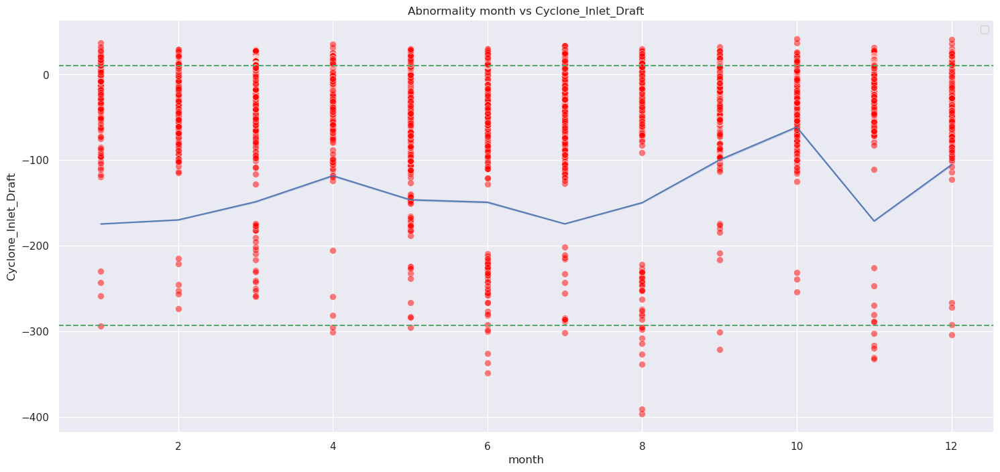

In [106]:
plot_isolation_forest('month' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


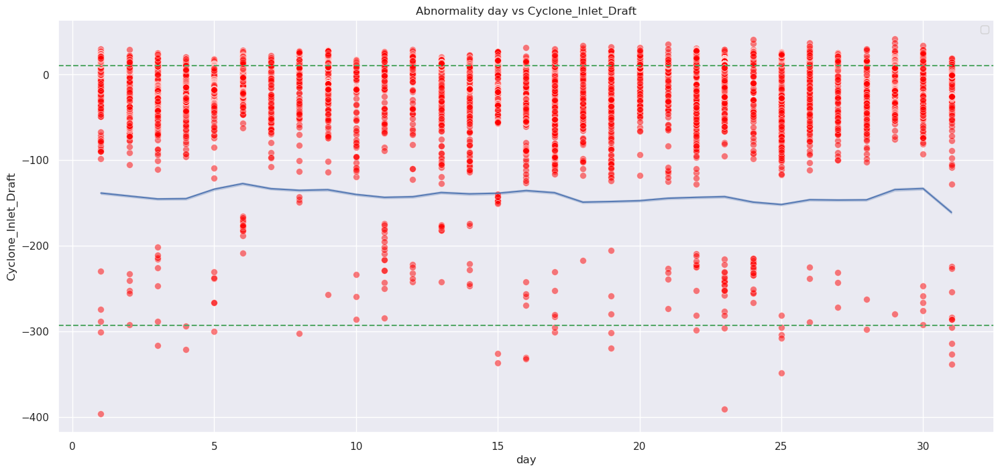

In [107]:
plot_isolation_forest('day' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


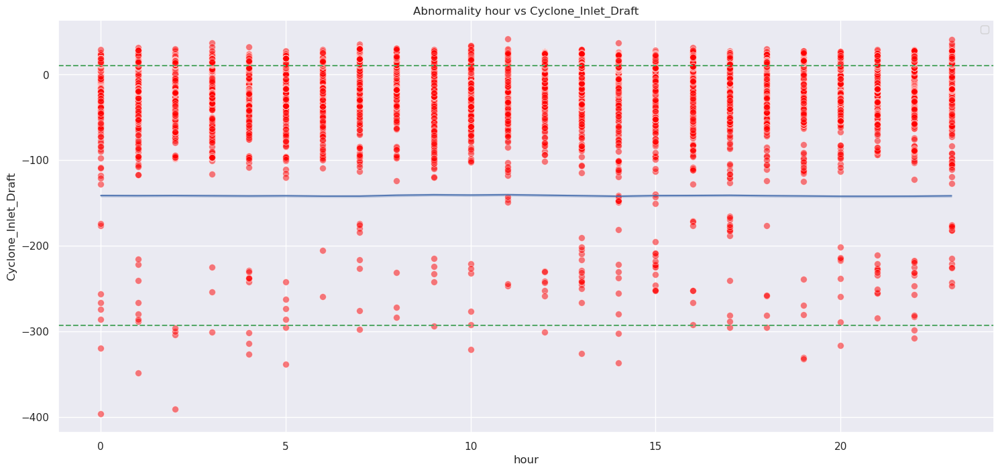

In [108]:
plot_isolation_forest('hour' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


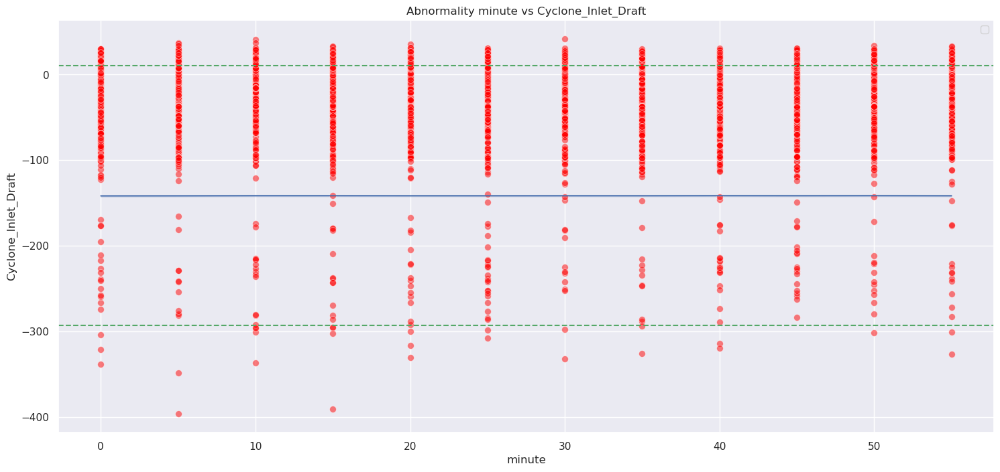

In [109]:
plot_isolation_forest('minute' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


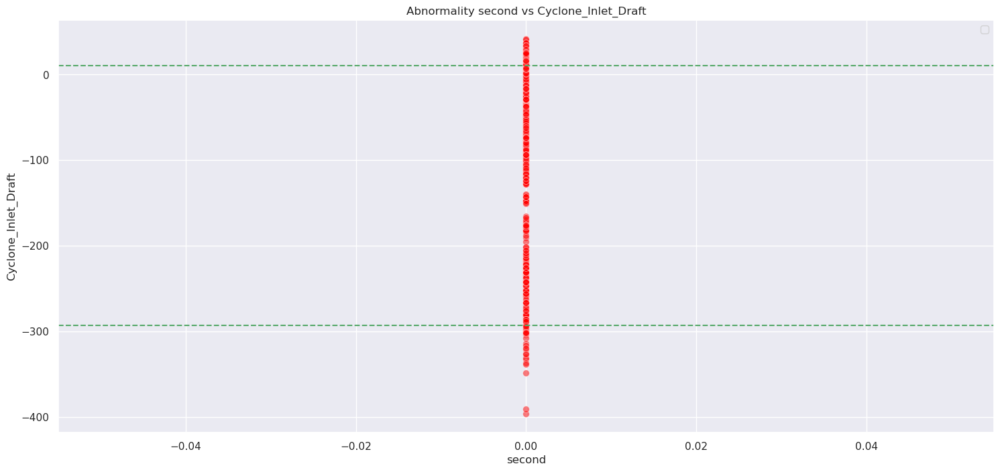

In [110]:
plot_isolation_forest('second' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


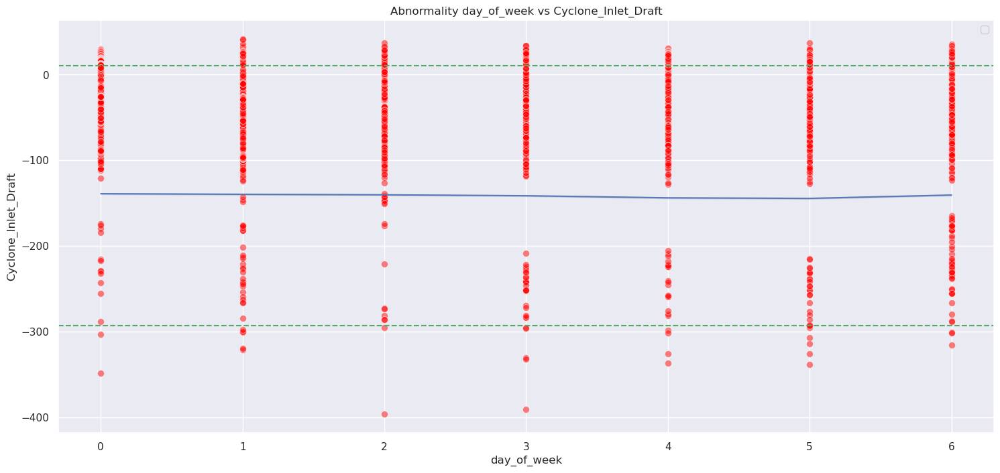

In [111]:
plot_isolation_forest('day_of_week' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


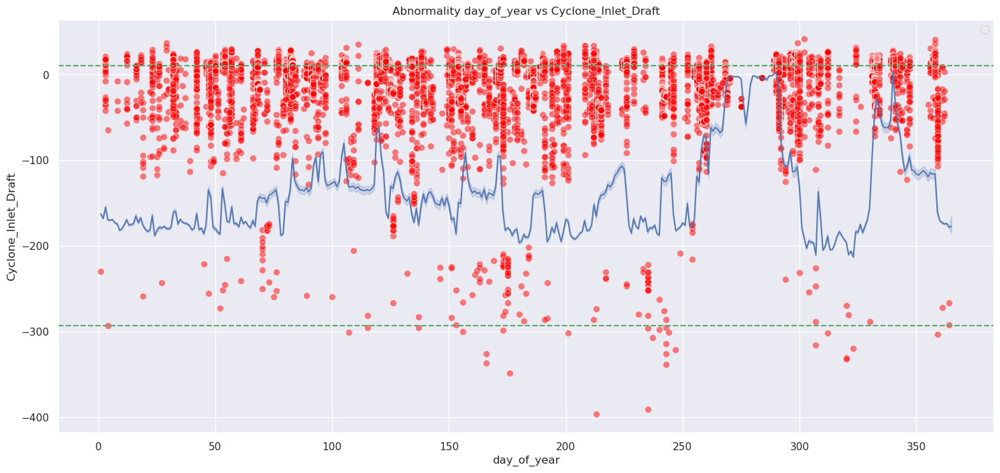

In [112]:
plot_isolation_forest('day_of_year' ,'Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


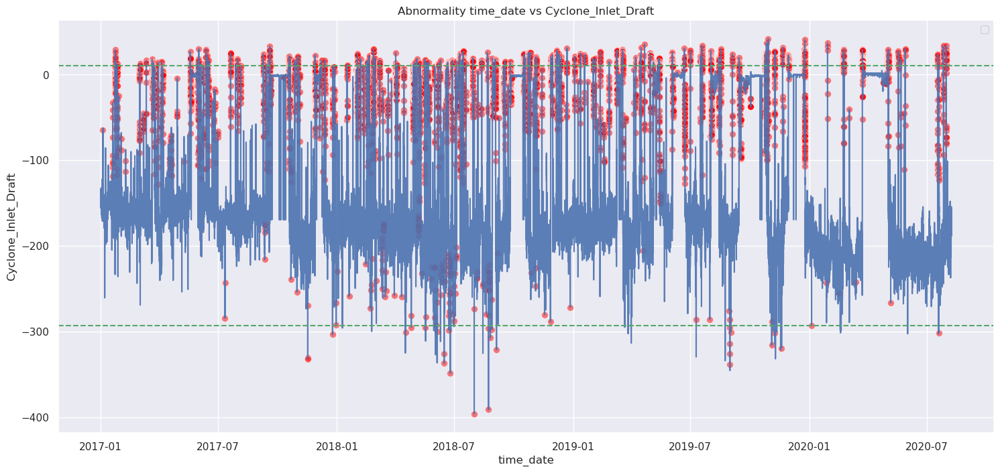

In [113]:
plot_isolation_forest('time_date' ,'Cyclone_Inlet_Draft')

Eliptic Envolope 

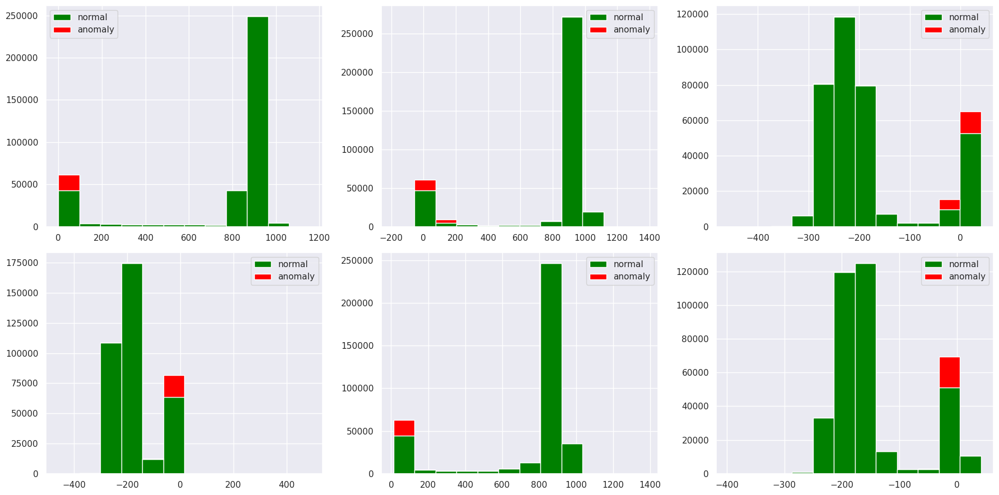

In [115]:
df_m =  df.copy()
input_data = df[cols]
envelope = EllipticEnvelope(contamination = 0.05)
envelope.fit(input_data)
y = envelope.predict(input_data)
df_m['anomaly_eliptic_envelope'] = pd.Series(y)
df_m['anomaly_eliptic_envelope'].value_counts()
    
plt.figure(figsize=[18, 9])
for i in range(len(cols)):
    a = df_m.loc[df_m['anomaly_eliptic_envelope'] == 1, cols[i]]
    b = df_m.loc[df_m['anomaly_eliptic_envelope'] == -1, cols[i]]
        
    plt.subplot(2, 3, i+1)
    plt.hist([a,b], bins=12, stacked=True, color=['green', 'red'], label=['normal', 'anomaly'])
    plt.legend()
        
plt.tight_layout()
plt.show()        